In [1]:

import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import json

client_id = "" 
client_secret = "" 


# Initialize the Spotify client with credentials
sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id=client_id, client_secret=client_secret))
                                        

In [3]:
import pandas as pd
# Define a function to search for artists for a specific year
def search_artists_by_year(year, offset):
    try:
        results = sp.search(f'year:{year}', type='artist', offset=offset, limit=50)
        return results['artists']['items']
    except Exception as e:
        print(f"An error occurred: {str(e)}")

# Cache results to a file
def cache_artist_data(data, filename):
    with open(filename, 'w') as file:
        json.dump(data, file)

# Query and cache artists for the year 2023 (up to 2000 records)
year = 2023
offset = 0
total_records = 0
artist_data = []

while offset < 1000:  # Limit to 2000 records
    results = search_artists_by_year(year, offset)
    if not results:
        break
    artist_data.extend(results)
    total_records += len(results)
    offset += len(results)


# Cache the data to a file
cache_filename = f'spartists_{year}.json'
cache_artist_data(artist_data, cache_filename)




In [2]:
import pandas as pd
import json

# Replace 'your_json_file.json' with the actual path to your JSON file
json_file = 'artists_2023.json'

# Read the JSON file
with open(json_file, 'r') as file:
    data = json.load(file)

# Flatten the JSON data
artist_df = pd.json_normalize(data)

# Now 'df' contains the flattened data
artist_df.rename({'popularity':'artist_popularity'}, axis=1, inplace=True)

In [69]:
artist_df.columns

Index(['genres', 'href', 'id', 'images', 'name', 'artist_popularity', 'type',
       'uri', 'external_urls.spotify', 'followers.href', 'followers.total'],
      dtype='object')

In [15]:
# Define a function to search for artists for a specific year
def search_tracks_by_year(year, offset):
    try:
        results = sp.search(f'year:{year}', type='track', offset=offset, limit=50)
        return results['tracks']['items']
    except Exception as e:
        print(f"An error occurred: {str(e)}")

# Cache results to a file
def cache_track_data(data, filename):
    with open(filename, 'w') as file:
        json.dump(data, file)

# Query and cache artists for the year 2023 (up to 2000 records)
year = 2023
offset = 0
total_records = 0
track_data = []

while offset < 1000:  # Limit to 2000 records
    results = search_tracks_by_year(year, offset)
    if not results:
        break
    track_data.extend(results)
    total_records += len(results)
    offset += len(results)


# Cache the data to a file
cache_filename = f'tracks_{year}.json'
cache_track_data(track_data, cache_filename)




In [70]:
pd.read_json(data)

ValueError: Invalid file path or buffer object type: <class 'list'>

In [3]:
# Replace 'your_json_file.json' with the actual path to your JSON file
json_file = 'tracks_2023.json'

# Read the JSON file
with open(json_file, 'r') as file:
    data = json.load(file)

# Flatten the JSON data
track_df = pd.json_normalize(data)

# Now 'df' contains the flattened data
track_df

,artists,available_markets,disc_number,duration_ms,explicit,href,id,is_local,name,popularity,...,album.id,album.images,album.name,album.release_date,album.release_date_precision,album.total_tracks,album.type,album.uri,external_ids.isrc,external_urls.spotify
0,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,227195,False,https://api.spotify.com/v1/tracks/4KULAymBBJcP...,4KULAymBBJcPRpk1yO4dOG,False,I Remember Everything (feat. Kacey Musgraves),93,...,6PbnGueEO6LGodPfvNldYf,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Zach Bryan,2023-08-25,day,16,album,spotify:album:6PbnGueEO6LGodPfvNldYf,USWB12304903,https://open.spotify.com/track/4KULAymBBJcPRpk...
1,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,260111,True,https://api.spotify.com/v1/tracks/2YSzYUF3jWqb...,2YSzYUF3jWqb9YP9VXmpjE,False,IDGAF (feat. Yeat),94,...,4czdORdCWP9umpbhFXK2fW,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",For All The Dogs,2023-10-06,day,23,album,spotify:album:4czdORdCWP9umpbhFXK2fW,USUG12306072,https://open.spotify.com/track/2YSzYUF3jWqb9YP...
2,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,137773,False,https://api.spotify.com/v1/tracks/3vkCueOmm7xQ...,3vkCueOmm7xQDoJ17W1Pm3,False,My Love Mine All Mine,97,...,2Cn1d2KgbkAqbZCJ1RzdkA,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",The Land Is Inhospitable and So Are We,2023-09-15,day,11,album,spotify:album:2Cn1d2KgbkAqbZCJ1RzdkA,USJ5G2335007,https://open.spotify.com/track/3vkCueOmm7xQDoJ...
3,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,125040,True,https://api.spotify.com/v1/tracks/4rXLjWdF2ZZp...,4rXLjWdF2ZZpXCVTfWcshS,False,fukumean,95,...,5qmZefgh78fN3jsyPPlvuw,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",a Gift & a Curse,2023-06-16,day,15,album,spotify:album:5qmZefgh78fN3jsyPPlvuw,USAT22306575,https://open.spotify.com/track/4rXLjWdF2ZZpXCV...
4,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,231750,True,https://api.spotify.com/v1/tracks/2IGMVunIBsBL...,2IGMVunIBsBLtEQyoI1Mu7,False,Paint The Town Red,98,...,54dZypaXHAIDzBe9ujAZ63,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Paint The Town Red,2023-08-04,day,1,album,spotify:album:54dZypaXHAIDzBe9ujAZ63,USRC12300907,https://open.spotify.com/track/2IGMVunIBsBLtEQ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,118923,True,https://api.spotify.com/v1/tracks/2hsNdc8rDVN2...,2hsNdc8rDVN2O5QOxbGayy,False,RICH SCHOLAR,71,...,51gfa3wuokik4pJTaZQ2om,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",RICH SCHOLAR,2023-06-16,day,1,album,spotify:album:51gfa3wuokik4pJTaZQ2om,QZVEM2332207,https://open.spotify.com/track/2hsNdc8rDVN2O5Q...
996,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,183022,False,https://api.spotify.com/v1/tracks/1TXbPx0WUaJM...,1TXbPx0WUaJM0fjDVs4wCD,False,Hands On Me (feat. Meghan Trainor),75,...,7tm57crYhN6WvRfB51A7Up,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Hands On Me (feat. Meghan Trainor),2023-10-13,day,1,album,spotify:album:7tm57crYhN6WvRfB51A7Up,USAT22309383,https://open.spotify.com/track/1TXbPx0WUaJM0fj...
997,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,132294,False,https://api.spotify.com/v1/tracks/4SW9gHnW8NfK...,4SW9gHnW8NfKOdqmh0ij45,False,Fruto,91,...,4NMv3cMkDwkkR6EdLloQDB,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",en dormir sin Madrid,2023-10-04,day,5,album,spotify:album:4NMv3cMkDwkkR6EdLloQDB,UYB282301044,https://open.spotify.com/track/4SW9gHnW8NfKOdq...
998,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG,

In [17]:
track_df.columns

Index(['artists', 'available_markets', 'disc_number', 'duration_ms',
       'explicit', 'href', 'id', 'is_local', 'name', 'popularity',
       'preview_url', 'track_number', 'type', 'uri', 'album.album_type',
       'album.artists', 'album.available_markets',
       'album.external_urls.spotify', 'album.href', 'album.id', 'album.images',
       'album.name', 'album.release_date', 'album.release_date_precision',
       'album.total_tracks', 'album.type', 'album.uri', 'external_ids.isrc',
       'external_urls.spotify'],
      dtype='object')

In [18]:
# Define a function to get audio features for a list of track IDs
def get_audio_features(track_ids):
    audio_features = []
    for i in range(0, len(track_ids), 50):
        batch = track_ids[i:i + 50]
        features = sp.audio_features(tracks=batch)
        audio_features.extend(features)
    return audio_features

# Extract track IDs from your DataFrame
track_ids = track_df['id'].tolist()

# Initialize an empty list to store all audio features
all_audio_features = []

# Enumerate through the track IDs
for index, start in enumerate(range(0, len(track_ids), 50)):
    end = min(start + 50, len(track_ids))
    batch_track_ids = track_ids[start:end]
    
    # Get audio features for the batch
    audio_features_batch = get_audio_features(batch_track_ids)
    
    # Extend the list of all audio features with the batch
    all_audio_features.extend(audio_features_batch)
    
    print(f'Batch {index + 1} processed')

# Create a new DataFrame from all audio features
audio_features_df = pd.DataFrame(all_audio_features)

# Save the audio features to a CSV file
audio_features_df.to_csv('audio_features.csv', index=False)

Batch 1 processed
Batch 2 processed
Batch 3 processed
Batch 4 processed
Batch 5 processed
Batch 6 processed
Batch 7 processed
Batch 8 processed
Batch 9 processed
Batch 10 processed
Batch 11 processed
Batch 12 processed
Batch 13 processed
Batch 14 processed
Batch 15 processed
Batch 16 processed
Batch 17 processed
Batch 18 processed
Batch 19 processed
Batch 20 processed


In [5]:
audio_features_df = pd.read_csv('audio_features.csv')
audio_features_df

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
0,0.429,0.453,0,-7.746,1,0.0459,0.5540,0.000002,0.1020,0.1550,77.639,audio_features,4KULAymBBJcPRpk1yO4dOG,spotify:track:4KULAymBBJcPRpk1yO4dOG,https://api.spotify.com/v1/tracks/4KULAymBBJcP...,https://api.spotify.com/v1/audio-analysis/4KUL...,227196,4
1,0.663,0.670,8,-8.399,1,0.2710,0.0464,0.000089,0.2050,0.1380,136.952,audio_features,2YSzYUF3jWqb9YP9VXmpjE,spotify:track:2YSzYUF3jWqb9YP9VXmpjE,https://api.spotify.com/v1/tracks/2YSzYUF3jWqb...,https://api.spotify.com/v1/audio-analysis/2YSz...,260111,4
2,0.504,0.308,9,-14.958,1,0.0321,0.8680,0.135000,0.1580,0.1210,113.950,audio_features,3vkCueOmm7xQDoJ17W1Pm3,spotify:track:3vkCueOmm7xQDoJ17W1Pm3,https://api.spotify.com/v1/tracks/3vkCueOmm7xQ...,https://api.spotify.com/v1/audio-analysis/3vkC...,137773,4
3,0.847,0.622,1,-6.747,0,0.0903,0.1190,0.000000,0.2850,0.2200,130.001,audio_features,4rXLjWdF2ZZpXCVTfWcshS,spotify:track:4rXLjWdF2ZZpXCVTfWcshS,https://api.spotify.com/v1/tracks/4rXLjWdF2ZZp...,https://api.spotify.com/v1/audio-analysis/4rXL...,125040,4
4,0.868,0.538,5,-8.603,1,0.1740,0.2690,0.000003,0.0901,0.7320,99.968,audio_features,2IGMVunIBsBLtEQyoI1Mu7,spotify:track:2IGMVunIBsBLtEQyoI1Mu7,https://api.spotify.com/v1/tracks/2IGMVunIBsBL...,https://api.spotify.com/v1/audio-analysis/2IGM...,231750,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.689,0.709,11,-8.094,1,0.5150,0.1040,0.000000,0.1700,0.6460,170.021,audio_features,2hsNdc8rDVN2O5QOxbGayy,spotify:track:2hsNdc8rDVN2O5QOxbGayy,https://api.spotify.com/v1/tracks/2hsNdc8rDVN2...,https://api.spotify.com/v1/audio-analysis/2hsN...,118924,3
996,0.691,0.639,9,-7.321,1,0.1250,0.0244,0.000000,0.1020,0.7100,141.918,audio_features,1TXbPx0WUaJM0fjDVs4wCD,spotify:track:1TXbPx0WUaJM0fjDVs4wCD,https://api.spotify.com/v1/tracks/1TXbPx0WUaJM...,https://api.spotify.com/v1/audio-analysis/1TXb...,183022,4
997,0.801,0.517,2,-8.205,0,0.2690,0.4940,0.000001,0.3550,0.9230,160.254,audio_features,4SW9gHnW8NfKOdqmh0ij45,spotify:track:4SW9gHnW8NfKOdqmh0ij45,https://api.spotify.com/v1/tracks/4SW9gHnW8NfK...,https://api.spotify.com/v1/audio-analysis/4SW9...,133969,4
998,0.461,0.411,5,-9.259,0,0.0451,0.5360,0.000000,0.1460,0.0944,86.520,audio_features,6KMbZt7u6AlDia2NPO0Liv,spotify:track:6KMbZt7u6AlDia2NPO0Liv,https://api.spotify.com/v1/tracks/6KMbZt7u6AlD...,https://api.spotify.com/v1/audio-analysis/6KMb...,310491,3


In [6]:
track_df_exploded = track_df.explode('artists')
track_df_exploded

,artists,available_markets,disc_number,duration_ms,explicit,href,id,is_local,name,popularity,...,album.id,album.images,album.name,album.release_date,album.release_date_precision,album.total_tracks,album.type,album.uri,external_ids.isrc,external_urls.spotify
0,{'external_urls': {'spotify': 'https://open.sp...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,227195,False,https://api.spotify.com/v1/tracks/4KULAymBBJcP...,4KULAymBBJcPRpk1yO4dOG,False,I Remember Everything (feat. Kacey Musgraves),93,...,6PbnGueEO6LGodPfvNldYf,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Zach Bryan,2023-08-25,day,16,album,spotify:album:6PbnGueEO6LGodPfvNldYf,USWB12304903,https://open.spotify.com/track/4KULAymBBJcPRpk...
0,{'external_urls': {'spotify': 'https://open.sp...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,227195,False,https://api.spotify.com/v1/tracks/4KULAymBBJcP...,4KULAymBBJcPRpk1yO4dOG,False,I Remember Everything (feat. Kacey Musgraves),93,...,6PbnGueEO6LGodPfvNldYf,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Zach Bryan,2023-08-25,day,16,album,spotify:album:6PbnGueEO6LGodPfvNldYf,USWB12304903,https://open.spotify.com/track/4KULAymBBJcPRpk...
1,{'external_urls': {'spotify': 'https://open.sp...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,260111,True,https://api.spotify.com/v1/tracks/2YSzYUF3jWqb...,2YSzYUF3jWqb9YP9VXmpjE,False,IDGAF (feat. Yeat),94,...,4czdORdCWP9umpbhFXK2fW,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",For All The Dogs,2023-10-06,day,23,album,spotify:album:4czdORdCWP9umpbhFXK2fW,USUG12306072,https://open.spotify.com/track/2YSzYUF3jWqb9YP...
1,{'external_urls': {'spotify': 'https://open.sp...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,260111,True,https://api.spotify.com/v1/tracks/2YSzYUF3jWqb...,2YSzYUF3jWqb9YP9VXmpjE,False,IDGAF (feat. Yeat),94,...,4czdORdCWP9umpbhFXK2fW,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",For All The Dogs,2023-10-06,day,23,album,spotify:album:4czdORdCWP9umpbhFXK2fW,USUG12306072,https://open.spotify.com/track/2YSzYUF3jWqb9YP...
2,{'external_urls': {'spotify': 'https://open.sp...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,137773,False,https://api.spotify.com/v1/tracks/3vkCueOmm7xQ...,3vkCueOmm7xQDoJ17W1Pm3,False,My Love Mine All Mine,97,...,2Cn1d2KgbkAqbZCJ1RzdkA,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",The Land Is Inhospitable and So Are We,2023-09-15,day,11,album,spotify:album:2Cn1d2KgbkAqbZCJ1RzdkA,USJ5G2335007,https://open.spotify.com/track/3vkCueOmm7xQDoJ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
997,{'external_urls': {'spotify': 'https://open.sp...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,132294,False,https://api.spotify.com/v1/tracks/4SW9gHnW8NfK...,4SW9gHnW8NfKOdqmh0ij45,False,Fruto,91,...,4NMv3cMkDwkkR6EdLloQDB,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",en dormir sin Madrid,2023-10-04,day,5,album,spotify:album:4NMv3cMkDwkkR6EdLloQDB,UYB282301044,https://open.spotify.com/track/4SW9gHnW8NfKOdq...
997,{'external_urls': {'spotify': 'https://open.sp...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,132294,False,https://api.spotify.com/v1/tracks/4SW9gHnW8NfK...,4SW9gHnW8NfKOdqmh0ij45,False,Fruto,91,...,4NMv3cMkDwkkR6EdLloQDB,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",en dormir sin Madrid,2023-10-04,day,5,album,spotify:album:4NMv3cMkDwkkR6EdLloQDB,UYB282301044,https://open.spotify.com/track/4SW9gHnW8NfKOdq...
998,{'external_urls': {'spotify': 'https://open.sp...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,310490,False,https://api.spotify.com/v1/tracks/6KMbZt7u6AlD...,6KMbZt7u6AlDia2NPO0Liv,False,Slime You Out (feat. SZA),73,...,35nmDyrcnDY4B1ISYpKEEs,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",For All The Dogs,2023-10-05,day,23,album,spotify:album:35nmDyrcnDY4B1ISYpKEEs,USUG12306065,https://open.spotify.com/track/6KMbZt7u6AlDia2...
998,{'external_urls': {'spotify': 'https://open.sp...,"[AR, AU, AT, BE, BO, 

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
0,0.429,0.453,0,-7.746,1,0.0459,0.5540,0.000002,0.1020,0.1550,77.639,audio_features,4KULAymBBJcPRpk1yO4dOG,spotify:track:4KULAymBBJcPRpk1yO4dOG,https://api.spotify.com/v1/tracks/4KULAymBBJcP...,https://api.spotify.com/v1/audio-analysis/4KUL...,227196,4
1,0.663,0.670,8,-8.399,1,0.2710,0.0464,0.000089,0.2050,0.1380,136.952,audio_features,2YSzYUF3jWqb9YP9VXmpjE,spotify:track:2YSzYUF3jWqb9YP9VXmpjE,https://api.spotify.com/v1/tracks/2YSzYUF3jWqb...,https://api.spotify.com/v1/audio-analysis/2YSz...,260111,4
2,0.504,0.308,9,-14.958,1,0.0321,0.8680,0.135000,0.1580,0.1210,113.950,audio_features,3vkCueOmm7xQDoJ17W1Pm3,spotify:track:3vkCueOmm7xQDoJ17W1Pm3,https://api.spotify.com/v1/tracks/3vkCueOmm7xQ...,https://api.spotify.com/v1/audio-analysis/3vkC...,137773,4
3,0.847,0.622,1,-6.747,0,0.0903,0.1190,0.000000,0.2850,0.2200,130.001,audio_features,4rXLjWdF2ZZpXCVTfWcshS,spotify:track:4rXLjWdF2ZZpXCVTfWcshS,https://api.spotify.com/v1/tracks/4rXLjWdF2ZZp...,https://api.spotify.com/v1/audio-analysis/4rXL...,125040,4
4,0.868,0.538,5,-8.603,1,0.1740,0.2690,0.000003,0.0901,0.7320,99.968,audio_features,2IGMVunIBsBLtEQyoI1Mu7,spotify:track:2IGMVunIBsBLtEQyoI1Mu7,https://api.spotify.com/v1/tracks/2IGMVunIBsBL...,https://api.spotify.com/v1/audio-analysis/2IGM...,231750,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.689,0.709,11,-8.094,1,0.5150,0.1040,0.000000,0.1700,0.6460,170.021,audio_features,2hsNdc8rDVN2O5QOxbGayy,spotify:track:2hsNdc8rDVN2O5QOxbGayy,https://api.spotify.com/v1/tracks/2hsNdc8rDVN2...,https://api.spotify.com/v1/audio-analysis/2hsN...,118924,3
996,0.691,0.639,9,-7.321,1,0.1250,0.0244,0.000000,0.1020,0.7100,141.918,audio_features,1TXbPx0WUaJM0fjDVs4wCD,spotify:track:1TXbPx0WUaJM0fjDVs4wCD,https://api.spotify.com/v1/tracks/1TXbPx0WUaJM...,https://api.spotify.com/v1/audio-analysis/1TXb...,183022,4
997,0.801,0.517,2,-8.205,0,0.2690,0.4940,0.000001,0.3550,0.9230,160.254,audio_features,4SW9gHnW8NfKOdqmh0ij45,spotify:track:4SW9gHnW8NfKOdqmh0ij45,https://api.spotify.com/v1/tracks/4SW9gHnW8NfK...,https://api.spotify.com/v1/audio-analysis/4SW9...,133969,4
998,0.461,0.411,5,-9.259,0,0.0451,0.5360,0.000000,0.1460,0.0944,86.520,audio_features,6KMbZt7u6AlDia2NPO0Liv,spotify:track:6KMbZt7u6AlDia2NPO0Liv,https://api.spotify.com/v1/tracks/6KMbZt7u6AlD...,https://api.spotify.com/v1/audio-analysis/6KMb...,310491,3


In [10]:
from pandas import json_normalize

track_df_exploded = json_normalize(track_df_exploded.to_dict(orient='records'))
track_df_exploded

,available_markets,disc_number,duration_ms,explicit,href,id,is_local,name,popularity,preview_url,...,album.type,album.uri,external_ids.isrc,external_urls.spotify,artists.external_urls.spotify,artists.href,artists.id,artists.name,artists.type,artists.uri
0,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,227195,False,https://api.spotify.com/v1/tracks/4KULAymBBJcP...,4KULAymBBJcPRpk1yO4dOG,False,I Remember Everything (feat. Kacey Musgraves),93,https://p.scdn.co/mp3-preview/22b240f7ef2eff38...,...,album,spotify:album:6PbnGueEO6LGodPfvNldYf,USWB12304903,https://open.spotify.com/track/4KULAymBBJcPRpk...,https://open.spotify.com/artist/40ZNYROS4zLfyy...,https://api.spotify.com/v1/artists/40ZNYROS4zL...,40ZNYROS4zLfyyBSs2PGe2,Zach Bryan,artist,spotify:artist:40ZNYROS4zLfyyBSs2PGe2
1,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,227195,False,https://api.spotify.com/v1/tracks/4KULAymBBJcP...,4KULAymBBJcPRpk1yO4dOG,False,I Remember Everything (feat. Kacey Musgraves),93,https://p.scdn.co/mp3-preview/22b240f7ef2eff38...,...,album,spotify:album:6PbnGueEO6LGodPfvNldYf,USWB12304903,https://open.spotify.com/track/4KULAymBBJcPRpk...,https://open.spotify.com/artist/70kkdajctXSbqS...,https://api.spotify.com/v1/artists/70kkdajctXS...,70kkdajctXSbqSMJbQO424,Kacey Musgraves,artist,spotify:artist:70kkdajctXSbqSMJbQO424
2,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,260111,True,https://api.spotify.com/v1/tracks/2YSzYUF3jWqb...,2YSzYUF3jWqb9YP9VXmpjE,False,IDGAF (feat. Yeat),94,None,...,album,spotify:album:4czdORdCWP9umpbhFXK2fW,USUG12306072,https://open.spotify.com/track/2YSzYUF3jWqb9YP...,https://open.spotify.com/artist/3TVXtAsR1Inumw...,https://api.spotify.com/v1/artists/3TVXtAsR1In...,3TVXtAsR1Inumwj472S9r4,Drake,artist,spotify:artist:3TVXtAsR1Inumwj472S9r4
3,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,260111,True,https://api.spotify.com/v1/tracks/2YSzYUF3jWqb...,2YSzYUF3jWqb9YP9VXmpjE,False,IDGAF (feat. Yeat),94,None,...,album,spotify:album:4czdORdCWP9umpbhFXK2fW,USUG12306072,https://open.spotify.com/track/2YSzYUF3jWqb9YP...,https://open.spotify.com/artist/3qiHUAX7zY4Qnj...,https://api.spotify.com/v1/artists/3qiHUAX7zY4...,3qiHUAX7zY4Qnjx8TNUzVx,Yeat,artist,spotify:artist:3qiHUAX7zY4Qnjx8TNUzVx
4,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,137773,False,https://api.spotify.com/v1/tracks/3vkCueOmm7xQ...,3vkCueOmm7xQDoJ17W1Pm3,False,My Love Mine All Mine,97,https://p.scdn.co/mp3-preview/2f90c9a6a2b6e385...,...,album,spotify:album:2Cn1d2KgbkAqbZCJ1RzdkA,USJ5G2335007,https://open.spotify.com/track/3vkCueOmm7xQDoJ...,https://open.spotify.com/artist/2uYWxilOVlUdk4...,https://api.spotify.com/v1/artists/2uYWxilOVlU...,2uYWxilOVlUdk4oV9DvwqK,Mitski,artist,spotify:artist:2uYWxilOVlUdk4oV9DvwqK
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1447,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,132294,False,https://api.spotify.com/v1/tracks/4SW9gHnW8NfK...,4SW9gHnW8NfKOdqmh0ij45,False,Fruto,91,https://p.scdn.co/mp3-preview/84d1b5d510f6a3f7...,...,album,spotify:album:4NMv3cMkDwkkR6EdLloQDB,UYB282301044,https://open.spotify.com/track/4SW9gHnW8NfKOdq...,https://open.spotify.com/artist/716NhGYqD1jl2w...,https://api.spotify.com/v1/artists/716NhGYqD1j...,716NhGYqD1jl2wI1Qkgq36,Bizarrap,artist,spotify:artist:716NhGYqD1jl2wI1Qkgq36
1448,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,132294,False,https://api.spotify.com/v1/tracks/4SW9gHnW8NfK...,4SW9gHnW8NfKOdqmh0ij45,False,Fruto,91,https://p.scdn.co/mp3-preview/84d1b5d510f6a3f7...,...,album,spotify:album:4NMv3cMkDwkkR6EdLloQDB,UYB282301044,https://open.spotify.com/track/4SW9gHnW8NfKOdq...,https://open.spotify.com/artist/19HM5j0ULGSmEo...,https://api.spotify.com/v1/artists/19HM5j0ULGS...,19HM5j0ULGSmEoRcrSe5x3,Milo j,artist,spotify:artist:19HM5j0ULGSmEoRcrSe5x3
1449,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,310490,False,https://api.spotify.com/v1/tracks/6KMbZt7u6AlD...,6KMbZt7u6AlDia2NPO0Liv,False,Slime You Out (

In [11]:
track_df_exploded.columns

Index(['available_markets', 'disc_number', 'duration_ms', 'explicit', 'href',
       'id', 'is_local', 'name', 'popularity', 'preview_url', 'track_number',
       'type', 'uri', 'album.album_type', 'album.artists',
       'album.available_markets', 'album.external_urls.spotify', 'album.href',
       'album.id', 'album.images', 'album.name', 'album.release_date',
       'album.release_date_precision', 'album.total_tracks', 'album.type',
       'album.uri', 'external_ids.isrc', 'external_urls.spotify',
       'artists.external_urls.spotify', 'artists.href', 'artists.id',
       'artists.name', 'artists.type', 'artists.uri'],
      dtype='object')

In [12]:
artist_df

,genres,href,id,images,name,artist_popularity,type,uri,external_urls.spotify,followers.href,followers.total
0,[pop],https://api.spotify.com/v1/artists/06HL4z0CvFA...,06HL4z0CvFAxyc27GXpf02,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Taylor Swift,100,artist,spotify:artist:06HL4z0CvFAxyc27GXpf02,https://open.spotify.com/artist/06HL4z0CvFAxyc...,None,91252884
1,"[canadian hip hop, canadian pop, hip hop, pop ...",https://api.spotify.com/v1/artists/3TVXtAsR1In...,3TVXtAsR1Inumwj472S9r4,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Drake,95,artist,spotify:artist:3TVXtAsR1Inumwj472S9r4,https://open.spotify.com/artist/3TVXtAsR1Inumw...,None,81392636
2,"[reggaeton, trap latino, urbano latino]",https://api.spotify.com/v1/artists/4q3ewBCX7sL...,4q3ewBCX7sLwd24euuV69X,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Bad Bunny,96,artist,spotify:artist:4q3ewBCX7sLwd24euuV69X,https://open.spotify.com/artist/4q3ewBCX7sLwd2...,None,76111938
3,"[classic oklahoma country, modern country pop]",https://api.spotify.com/v1/artists/40ZNYROS4zL...,40ZNYROS4zLfyyBSs2PGe2,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Zach Bryan,86,artist,spotify:artist:40ZNYROS4zLfyyBSs2PGe2,https://open.spotify.com/artist/40ZNYROS4zLfyy...,None,2484367
4,"[hip hop, rap, slap house]",https://api.spotify.com/v1/artists/0Y5tJX1MQlP...,0Y5tJX1MQlPlqiwlOH1tJY,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Travis Scott,90,artist,spotify:artist:0Y5tJX1MQlPlqiwlOH1tJY,https://open.spotify.com/artist/0Y5tJX1MQlPlqi...,None,24911430
...,...,...,...,...,...,...,...,...,...,...,...
995,[indie pop rap],https://api.spotify.com/v1/artists/3ApUX1o6oSz...,3ApUX1o6oSz321MMECyIYd,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Quinn XCII,62,artist,spotify:artist:3ApUX1o6oSz321MMECyIYd,https://open.spotify.com/artist/3ApUX1o6oSz321...,None,772546
996,"[bubblegrunge, chicago indie, indie pop, pov: ...",https://api.spotify.com/v1/artists/2vnB6tuQMaQ...,2vnB6tuQMaQpORiRdvXF9H,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Beach Bunny,66,artist,spotify:artist:2vnB6tuQMaQpORiRdvXF9H,https://open.spotify.com/artist/2vnB6tuQMaQpOR...,None,1224257
997,"[alternative r&b, dance pop, metropopolis, pop...",https://api.spotify.com/v1/artists/0NIIxcxNHmO...,0NIIxcxNHmOoyBx03SfTCD,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Tinashe,65,artist,spotify:artist:0NIIxcxNHmOoyBx03SfTCD,https://open.spotify.com/artist/0NIIxcxNHmOoyB...,None,2675256
998,"[corrido, corridos tumbados, sierreno]",https://api.spotify.com/v1/artists/6twEaJ9RPRY...,6twEaJ9RPRYiCmWapjG8xh,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Tony Aguirre,67,artist,spotify:artist:6twEaJ9RPRYiCmWapjG8xh,https://open.spotify.com/artist/6twEaJ9RPRYiCm...,None,328688


In [14]:
merged_df = track_df_exploded.merge(artist_df, left_on='artists.id', right_on='id', how='left')
merged_df.columns

Index(['available_markets', 'disc_number', 'duration_ms', 'explicit', 'href_x',
       'id_x', 'is_local', 'name_x', 'popularity', 'preview_url',
       'track_number', 'type_x', 'uri_x', 'album.album_type', 'album.artists',
       'album.available_markets', 'album.external_urls.spotify', 'album.href',
       'album.id', 'album.images', 'album.name', 'album.release_date',
       'album.release_date_precision', 'album.total_tracks', 'album.type',
       'album.uri', 'external_ids.isrc', 'external_urls.spotify_x',
       'artists.external_urls.spotify', 'artists.href', 'artists.id',
       'artists.name', 'artists.type', 'artists.uri', 'genres', 'href_y',
       'id_y', 'images', 'name_y', 'artist_popularity', 'type_y', 'uri_y',
       'external_urls.spotify_y', 'followers.href', 'followers.total'],
      dtype='object')

In [15]:
merged_df.rename({'id_x': 'song_id', 'name_x': 'song_name','id_y': 'artist_id', 'name_y': 'artist_name'}, axis=1, inplace=True)
merged_df

,available_markets,disc_number,duration_ms,explicit,href_x,song_id,is_local,song_name,popularity,preview_url,...,href_y,artist_id,images,artist_name,artist_popularity,type_y,uri_y,external_urls.spotify_y,followers.href,followers.total
0,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,227195,False,https://api.spotify.com/v1/tracks/4KULAymBBJcP...,4KULAymBBJcPRpk1yO4dOG,False,I Remember Everything (feat. Kacey Musgraves),93,https://p.scdn.co/mp3-preview/22b240f7ef2eff38...,...,https://api.spotify.com/v1/artists/40ZNYROS4zL...,40ZNYROS4zLfyyBSs2PGe2,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Zach Bryan,86.0,artist,spotify:artist:40ZNYROS4zLfyyBSs2PGe2,https://open.spotify.com/artist/40ZNYROS4zLfyy...,None,2484367.0
1,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,227195,False,https://api.spotify.com/v1/tracks/4KULAymBBJcP...,4KULAymBBJcPRpk1yO4dOG,False,I Remember Everything (feat. Kacey Musgraves),93,https://p.scdn.co/mp3-preview/22b240f7ef2eff38...,...,https://api.spotify.com/v1/artists/70kkdajctXS...,70kkdajctXSbqSMJbQO424,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Kacey Musgraves,74.0,artist,spotify:artist:70kkdajctXSbqSMJbQO424,https://open.spotify.com/artist/70kkdajctXSbqS...,None,1252361.0
2,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,260111,True,https://api.spotify.com/v1/tracks/2YSzYUF3jWqb...,2YSzYUF3jWqb9YP9VXmpjE,False,IDGAF (feat. Yeat),94,None,...,https://api.spotify.com/v1/artists/3TVXtAsR1In...,3TVXtAsR1Inumwj472S9r4,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Drake,95.0,artist,spotify:artist:3TVXtAsR1Inumwj472S9r4,https://open.spotify.com/artist/3TVXtAsR1Inumw...,None,81392636.0
3,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,260111,True,https://api.spotify.com/v1/tracks/2YSzYUF3jWqb...,2YSzYUF3jWqb9YP9VXmpjE,False,IDGAF (feat. Yeat),94,None,...,https://api.spotify.com/v1/artists/3qiHUAX7zY4...,3qiHUAX7zY4Qnjx8TNUzVx,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Yeat,81.0,artist,spotify:artist:3qiHUAX7zY4Qnjx8TNUzVx,https://open.spotify.com/artist/3qiHUAX7zY4Qnj...,None,3426657.0
4,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,137773,False,https://api.spotify.com/v1/tracks/3vkCueOmm7xQ...,3vkCueOmm7xQDoJ17W1Pm3,False,My Love Mine All Mine,97,https://p.scdn.co/mp3-preview/2f90c9a6a2b6e385...,...,https://api.spotify.com/v1/artists/2uYWxilOVlU...,2uYWxilOVlUdk4oV9DvwqK,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Mitski,81.0,artist,spotify:artist:2uYWxilOVlUdk4oV9DvwqK,https://open.spotify.com/artist/2uYWxilOVlUdk4...,None,5568028.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1447,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,132294,False,https://api.spotify.com/v1/tracks/4SW9gHnW8NfK...,4SW9gHnW8NfKOdqmh0ij45,False,Fruto,91,https://p.scdn.co/mp3-preview/84d1b5d510f6a3f7...,...,https://api.spotify.com/v1/artists/716NhGYqD1j...,716NhGYqD1jl2wI1Qkgq36,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Bizarrap,84.0,artist,spotify:artist:716NhGYqD1jl2wI1Qkgq36,https://open.spotify.com/artist/716NhGYqD1jl2w...,None,13086837.0
1448,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,132294,False,https://api.spotify.com/v1/tracks/4SW9gHnW8NfK...,4SW9gHnW8NfKOdqmh0ij45,False,Fruto,91,https://p.scdn.co/mp3-preview/84d1b5d510f6a3f7...,...,https://api.spotify.com/v1/artists/19HM5j0ULGS...,19HM5j0ULGSmEoRcrSe5x3,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Milo j,81.0,artist,spotify:artist:19HM5j0ULGSmEoRcrSe5x3,https://open.spotify.com/artist/19HM5j0ULGSmEo...,None,1373051.0
1449,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,310490,False,https://api.spotify.com/v1/tracks/6KMbZt7u6AlD...,6KMbZt7u6AlDia2NPO0Liv,False,Slime You Out (feat. SZA),73,None,...,https://api.spotify.com/v1/artists/3TVXtAsR1In...,3TVXtAsR1Inumwj472S9r4,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Drake,95.0,artist,spotify:artist:3TVXtAsR1Inumwj472S9r4,https://open.spotify.com/artist/3TVXtAsR1Inumw...,N

In [126]:
import pandas as pd


# Merge artist data into track_df using artist IDs

# Drop the redundant 'id' column (if needed)
# merged_df.drop('id', axis=1, inplace=True)

# Print the resulting DataFrame



In [16]:
artist_df.columns

Index(['genres', 'href', 'id', 'images', 'name', 'artist_popularity', 'type',
       'uri', 'external_urls.spotify', 'followers.href', 'followers.total'],
      dtype='object')

In [17]:
track_df.columns

Index(['artists', 'available_markets', 'disc_number', 'duration_ms',
       'explicit', 'href', 'id', 'is_local', 'name', 'popularity',
       'preview_url', 'track_number', 'type', 'uri', 'album.album_type',
       'album.artists', 'album.available_markets',
       'album.external_urls.spotify', 'album.href', 'album.id', 'album.images',
       'album.name', 'album.release_date', 'album.release_date_precision',
       'album.total_tracks', 'album.type', 'album.uri', 'external_ids.isrc',
       'external_urls.spotify'],
      dtype='object')

In [18]:
audio_features_df.columns

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'type', 'id', 'uri', 'track_href', 'analysis_url', 'duration_ms',
       'time_signature'],
      dtype='object')

In [19]:
track_audio_features_df = track_df.merge(audio_features_df, how='left', on='id')
track_audio_features_df

,artists,available_markets,disc_number,duration_ms_x,explicit,href,id,is_local,name,popularity,...,instrumentalness,liveness,valence,tempo,type_y,uri_y,track_href,analysis_url,duration_ms_y,time_signature
0,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,227195,False,https://api.spotify.com/v1/tracks/4KULAymBBJcP...,4KULAymBBJcPRpk1yO4dOG,False,I Remember Everything (feat. Kacey Musgraves),93,...,0.000002,0.1020,0.1550,77.639,audio_features,spotify:track:4KULAymBBJcPRpk1yO4dOG,https://api.spotify.com/v1/tracks/4KULAymBBJcP...,https://api.spotify.com/v1/audio-analysis/4KUL...,227196,4
1,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,260111,True,https://api.spotify.com/v1/tracks/2YSzYUF3jWqb...,2YSzYUF3jWqb9YP9VXmpjE,False,IDGAF (feat. Yeat),94,...,0.000089,0.2050,0.1380,136.952,audio_features,spotify:track:2YSzYUF3jWqb9YP9VXmpjE,https://api.spotify.com/v1/tracks/2YSzYUF3jWqb...,https://api.spotify.com/v1/audio-analysis/2YSz...,260111,4
2,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,137773,False,https://api.spotify.com/v1/tracks/3vkCueOmm7xQ...,3vkCueOmm7xQDoJ17W1Pm3,False,My Love Mine All Mine,97,...,0.135000,0.1580,0.1210,113.950,audio_features,spotify:track:3vkCueOmm7xQDoJ17W1Pm3,https://api.spotify.com/v1/tracks/3vkCueOmm7xQ...,https://api.spotify.com/v1/audio-analysis/3vkC...,137773,4
3,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,125040,True,https://api.spotify.com/v1/tracks/4rXLjWdF2ZZp...,4rXLjWdF2ZZpXCVTfWcshS,False,fukumean,95,...,0.000000,0.2850,0.2200,130.001,audio_features,spotify:track:4rXLjWdF2ZZpXCVTfWcshS,https://api.spotify.com/v1/tracks/4rXLjWdF2ZZp...,https://api.spotify.com/v1/audio-analysis/4rXL...,125040,4
4,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,231750,True,https://api.spotify.com/v1/tracks/2IGMVunIBsBL...,2IGMVunIBsBLtEQyoI1Mu7,False,Paint The Town Red,98,...,0.000003,0.0901,0.7320,99.968,audio_features,spotify:track:2IGMVunIBsBLtEQyoI1Mu7,https://api.spotify.com/v1/tracks/2IGMVunIBsBL...,https://api.spotify.com/v1/audio-analysis/2IGM...,231750,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,118923,True,https://api.spotify.com/v1/tracks/2hsNdc8rDVN2...,2hsNdc8rDVN2O5QOxbGayy,False,RICH SCHOLAR,71,...,0.000000,0.1700,0.6460,170.021,audio_features,spotify:track:2hsNdc8rDVN2O5QOxbGayy,https://api.spotify.com/v1/tracks/2hsNdc8rDVN2...,https://api.spotify.com/v1/audio-analysis/2hsN...,118924,3
996,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,183022,False,https://api.spotify.com/v1/tracks/1TXbPx0WUaJM...,1TXbPx0WUaJM0fjDVs4wCD,False,Hands On Me (feat. Meghan Trainor),75,...,0.000000,0.1020,0.7100,141.918,audio_features,spotify:track:1TXbPx0WUaJM0fjDVs4wCD,https://api.spotify.com/v1/tracks/1TXbPx0WUaJM...,https://api.spotify.com/v1/audio-analysis/1TXb...,183022,4
997,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,132294,False,https://api.spotify.com/v1/tracks/4SW9gHnW8NfK...,4SW9gHnW8NfKOdqmh0ij45,False,Fruto,91,...,0.000001,0.3550,0.9230,160.254,audio_features,spotify:track:4SW9gHnW8NfKOdqmh0ij45,https://api.spotify.com/v1/tracks/4SW9gHnW8NfK...,https://api.spotify.com/v1/audio-analysis/4SW9...,133969,4
998,[{'external_urls': {'spotify': 'https://open.s...,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,310490,False,https://api.spotify.com/v1/tracks/6KMbZt7u6AlD...,6KMbZt7u6AlDia2NPO0Liv,False,Slime You Out (feat. SZA),73,...,0.000000,0.1460,0.0944,86.520,audio_features,spotify:track:6KMbZt7u6AlDia2NPO0Liv,https://api.spotify.com/v1/tracks/6KMbZt7u6AlD.

In [20]:
df = merged_df.merge(track_audio_features_df, left_on='song_id' ,right_on='id', how='left')
df

,available_markets_x,disc_number_x,duration_ms,explicit_x,href_x,song_id,is_local_x,song_name,popularity_x,preview_url_x,...,instrumentalness,liveness,valence,tempo,type_y_y,uri_y_y,track_href,analysis_url,duration_ms_y,time_signature
0,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,227195,False,https://api.spotify.com/v1/tracks/4KULAymBBJcP...,4KULAymBBJcPRpk1yO4dOG,False,I Remember Everything (feat. Kacey Musgraves),93,https://p.scdn.co/mp3-preview/22b240f7ef2eff38...,...,0.000002,0.102,0.1550,77.639,audio_features,spotify:track:4KULAymBBJcPRpk1yO4dOG,https://api.spotify.com/v1/tracks/4KULAymBBJcP...,https://api.spotify.com/v1/audio-analysis/4KUL...,227196,4
1,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,227195,False,https://api.spotify.com/v1/tracks/4KULAymBBJcP...,4KULAymBBJcPRpk1yO4dOG,False,I Remember Everything (feat. Kacey Musgraves),93,https://p.scdn.co/mp3-preview/22b240f7ef2eff38...,...,0.000002,0.102,0.1550,77.639,audio_features,spotify:track:4KULAymBBJcPRpk1yO4dOG,https://api.spotify.com/v1/tracks/4KULAymBBJcP...,https://api.spotify.com/v1/audio-analysis/4KUL...,227196,4
2,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,260111,True,https://api.spotify.com/v1/tracks/2YSzYUF3jWqb...,2YSzYUF3jWqb9YP9VXmpjE,False,IDGAF (feat. Yeat),94,None,...,0.000089,0.205,0.1380,136.952,audio_features,spotify:track:2YSzYUF3jWqb9YP9VXmpjE,https://api.spotify.com/v1/tracks/2YSzYUF3jWqb...,https://api.spotify.com/v1/audio-analysis/2YSz...,260111,4
3,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,260111,True,https://api.spotify.com/v1/tracks/2YSzYUF3jWqb...,2YSzYUF3jWqb9YP9VXmpjE,False,IDGAF (feat. Yeat),94,None,...,0.000089,0.205,0.1380,136.952,audio_features,spotify:track:2YSzYUF3jWqb9YP9VXmpjE,https://api.spotify.com/v1/tracks/2YSzYUF3jWqb...,https://api.spotify.com/v1/audio-analysis/2YSz...,260111,4
4,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,137773,False,https://api.spotify.com/v1/tracks/3vkCueOmm7xQ...,3vkCueOmm7xQDoJ17W1Pm3,False,My Love Mine All Mine,97,https://p.scdn.co/mp3-preview/2f90c9a6a2b6e385...,...,0.135000,0.158,0.1210,113.950,audio_features,spotify:track:3vkCueOmm7xQDoJ17W1Pm3,https://api.spotify.com/v1/tracks/3vkCueOmm7xQ...,https://api.spotify.com/v1/audio-analysis/3vkC...,137773,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1447,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,132294,False,https://api.spotify.com/v1/tracks/4SW9gHnW8NfK...,4SW9gHnW8NfKOdqmh0ij45,False,Fruto,91,https://p.scdn.co/mp3-preview/84d1b5d510f6a3f7...,...,0.000001,0.355,0.9230,160.254,audio_features,spotify:track:4SW9gHnW8NfKOdqmh0ij45,https://api.spotify.com/v1/tracks/4SW9gHnW8NfK...,https://api.spotify.com/v1/audio-analysis/4SW9...,133969,4
1448,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,132294,False,https://api.spotify.com/v1/tracks/4SW9gHnW8NfK...,4SW9gHnW8NfKOdqmh0ij45,False,Fruto,91,https://p.scdn.co/mp3-preview/84d1b5d510f6a3f7...,...,0.000001,0.355,0.9230,160.254,audio_features,spotify:track:4SW9gHnW8NfKOdqmh0ij45,https://api.spotify.com/v1/tracks/4SW9gHnW8NfK...,https://api.spotify.com/v1/audio-analysis/4SW9...,133969,4
1449,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,310490,False,https://api.spotify.com/v1/tracks/6KMbZt7u6AlD...,6KMbZt7u6AlDia2NPO0Liv,False,Slime You Out (feat. SZA),73,None,...,0.000000,0.146,0.0944,86.520,audio_features,spotify:track:6KMbZt7u6AlDia2NPO0Liv,https://api.spotify.com/v1/tracks/6KMbZt7u6AlD...,https://api.spotify.com/v1/audio-analysis/6KMb...,310491,3
1450,"[AR, AU, AT, BE, BO, BR, BG, CA, CL, CO, CR, C...",1,310490,False,https://api.spotify.com/v1/tracks/6KMbZt7u6AlD...,6KMbZt7u6AlDia2NPO0Liv,False,Slime You Out (feat. SZA),73,None,...,0.000000,0.146,0.0944,86.520,audio_features,spotify:track:6KMbZt7u6AlDia2NPO0Liv,https://api.spotify.com/v1/tracks/6KMbZt7u6AlD...,https://api.spotify.com/v1/audio-analysis/6KMb...,310491,3


In [21]:
df.columns

Index(['available_markets_x', 'disc_number_x', 'duration_ms', 'explicit_x',
       'href_x', 'song_id', 'is_local_x', 'song_name', 'popularity_x',
       'preview_url_x', 'track_number_x', 'type_x_x', 'uri_x_x',
       'album.album_type_x', 'album.artists_x', 'album.available_markets_x',
       'album.external_urls.spotify_x', 'album.href_x', 'album.id_x',
       'album.images_x', 'album.name_x', 'album.release_date_x',
       'album.release_date_precision_x', 'album.total_tracks_x',
       'album.type_x', 'album.uri_x', 'external_ids.isrc_x',
       'external_urls.spotify_x', 'artists.external_urls.spotify',
       'artists.href', 'artists.id', 'artists.name', 'artists.type',
       'artists.uri', 'genres', 'href_y', 'artist_id', 'images', 'artist_name',
       'artist_popularity', 'type_y_x', 'uri_y_x', 'external_urls.spotify_y',
       'followers.href', 'followers.total', 'artists', 'available_markets_y',
       'disc_number_y', 'duration_ms_x', 'explicit_y', 'href', 'id',
       'i

In [22]:
df['explicit_y']

0       False
1       False
2        True
3        True
4       False
        ...  
1447    False
1448    False
1449    False
1450    False
1451     True
Name: explicit_y, Length: 1452, dtype: bool

In [128]:
df_sampled[["track_number",'track_number']]

,track_number,track_number,track_number,track_number
0,11,11,11,11
1,11,11,11,11
2,7,7,7,7
3,7,7,7,7
4,7,7,7,7
...,...,...,...,...
1447,4,4,4,4
1448,4,4,4,4
1449,9,9,9,9
1450,9,9,9,9


In [129]:
df_sampled = df[['artist_id', 'artist_name','artist_popularity','followers.total','genres', 'song_id', 'song_name', 'album.id_y','album.name_x','popularity_x',
    'available_markets_x', 'duration_ms', 'track_number_x', 'album.release_date_x',
 'album.total_tracks_x',  'album.album_type_y', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature']]



df_sampled = df_sampled.rename({"available_markets_x": 'track_available_markets', 'popularity_x': 'track_popularity',
            'track_number_x':"track_number",'album.release_date_x':'album_release_date','followers.total':'artist_followers',
            'album.total_tracks_x':'album_total_tracks','genres':'artist_genres',
            'album.album_type_y':'album_type_y', 'album.id_y':'album_id','album.name_x':'album_name',
 }, axis=1)
df_sampled

,artist_id,artist_name,artist_popularity,artist_followers,artist_genres,song_id,song_name,album_id,album_name,track_popularity,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,40ZNYROS4zLfyyBSs2PGe2,Zach Bryan,86.0,2484367.0,"[classic oklahoma country, modern country pop]",4KULAymBBJcPRpk1yO4dOG,I Remember Everything (feat. Kacey Musgraves),6PbnGueEO6LGodPfvNldYf,Zach Bryan,93,...,0,-7.746,1,0.0459,0.5540,0.000002,0.102,0.1550,77.639,4
1,70kkdajctXSbqSMJbQO424,Kacey Musgraves,74.0,1252361.0,"[classic texas country, contemporary country, ...",4KULAymBBJcPRpk1yO4dOG,I Remember Everything (feat. Kacey Musgraves),6PbnGueEO6LGodPfvNldYf,Zach Bryan,93,...,0,-7.746,1,0.0459,0.5540,0.000002,0.102,0.1550,77.639,4
2,3TVXtAsR1Inumwj472S9r4,Drake,95.0,81392636.0,"[canadian hip hop, canadian pop, hip hop, pop ...",2YSzYUF3jWqb9YP9VXmpjE,IDGAF (feat. Yeat),4czdORdCWP9umpbhFXK2fW,For All The Dogs,94,...,8,-8.399,1,0.2710,0.0464,0.000089,0.205,0.1380,136.952,4
3,3qiHUAX7zY4Qnjx8TNUzVx,Yeat,81.0,3426657.0,"[pluggnb, rage rap]",2YSzYUF3jWqb9YP9VXmpjE,IDGAF (feat. Yeat),4czdORdCWP9umpbhFXK2fW,For All The Dogs,94,...,8,-8.399,1,0.2710,0.0464,0.000089,0.205,0.1380,136.952,4
4,2uYWxilOVlUdk4oV9DvwqK,Mitski,81.0,5568028.0,"[brooklyn indie, pov: indie]",3vkCueOmm7xQDoJ17W1Pm3,My Love Mine All Mine,2Cn1d2KgbkAqbZCJ1RzdkA,The Land Is Inhospitable and So Are We,97,...,9,-14.958,1,0.0321,0.8680,0.135000,0.158,0.1210,113.950,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1447,716NhGYqD1jl2wI1Qkgq36,Bizarrap,84.0,13086837.0,"[argentine hip hop, pop venezolano, trap argen...",4SW9gHnW8NfKOdqmh0ij45,Fruto,4NMv3cMkDwkkR6EdLloQDB,en dormir sin Madrid,91,...,2,-8.205,0,0.2690,0.4940,0.000001,0.355,0.9230,160.254,4
1448,19HM5j0ULGSmEoRcrSe5x3,Milo j,81.0,1373051.0,[trap argentino],4SW9gHnW8NfKOdqmh0ij45,Fruto,4NMv3cMkDwkkR6EdLloQDB,en dormir sin Madrid,91,...,2,-8.205,0,0.2690,0.4940,0.000001,0.355,0.9230,160.254,4
1449,3TVXtAsR1Inumwj472S9r4,Drake,95.0,81392636.0,"[canadian hip hop, canadian pop, hip hop, pop ...",6KMbZt7u6AlDia2NPO0Liv,Slime You Out (feat. SZA),35nmDyrcnDY4B1ISYpKEEs,For All The Dogs,73,...,5,-9.259,0,0.0451,0.5360,0.000000,0.146,0.0944,86.520,3
1450,7tYKF4w9nC0nq9CsPZTHyP,SZA,87.0,15522335.0,"[pop, r&b, rap]",6KMbZt7u6AlDia2NPO0Liv,Slime You Out (feat. SZA),35nmDyrcnDY4B1ISYpKEEs,For All The Dogs,73,...,5,-9.259,0,0.0451,0.5360,0.000000,0.146,0.0944,86.520,3


In [24]:
df_sampled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1452 entries, 0 to 1451
Data columns (total 29 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   artist_id                1263 non-null   object 
 1   artist_name              1263 non-null   object 
 2   artist_popularity        1263 non-null   float64
 3   artist_followers         1263 non-null   float64
 4   artist_genres            1263 non-null   object 
 5   song_id                  1452 non-null   object 
 6   song_name                1452 non-null   object 
 7   album_id                 1452 non-null   object 
 8   album_name               1452 non-null   object 
 9   track_popularity         1452 non-null   int64  
 10  track_available_markets  1452 non-null   object 
 11  duration_ms              1452 non-null   int64  
 12  track_number             1452 non-null   int64  
 13  album_release_date       1452 non-null   object 
 14  album_total_tracks      

In [25]:
df_sampled.describe()

,artist_popularity,artist_followers,track_popularity,duration_ms,track_number,album_total_tracks,track_number,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,1263.000000,1.263000e+03,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000
mean,81.489311,2.058310e+07,76.478650,198410.151515,5.763085,11.785124,5.763085,0.660118,0.646701,5.205234,-6.538461,0.581956,0.106426,0.235045,0.017610,0.180251,0.483600,124.512818,3.873278
std,8.947266,2.900856e+07,18.148714,53715.050804,7.014925,12.876794,7.014925,0.143238,0.171071,3.648290,2.879784,0.493407,0.100528,0.248366,0.101246,0.132383,0.237483,28.102645,0.391751
min,62.000000,5.373000e+03,0.000000,36226.000000,1.000000,1.000000,1.000000,0.143000,0.000116,0.000000,-41.300000,0.000000,0.023800,0.000013,0.000000,0.023200,0.000000,56.829000,1.000000
25%,75.000000,1.890602e+06,75.000000,165480.250000,1.000000,1.000000,1.000000,0.565750,0.544000,1.000000,-7.755750,0.000000,0.039300,0.036950,0.000000,0.101000,0.282000,102.025000,4.000000
50%,81.000000,6.944570e+06,79.000000,192710.000000,2.000000,11.000000,2.000000,0.668000,0.659000,5.000000,-6.181500,1.000000,0.058900,0.134000,0.000000,0.125000,0.484000,125.082500,4.000000
75%,87.000000,2.491143e+07,84.000000,226402.250000,9.000000,18.000000,9.000000,0.772250,0.778000,8.000000,-4.789500,1.000000,0.126000,0.385000,0.000041,0.216250,0.671000,143.090000,4.000000
max,100.000000,1.150976e+08,99.000000,500116.000000,52.000000,199.000000,52.000000,0.971000,0.994000,11.000000,-0.517000,1.000000,0.553000,0.994000,0.973000,0.948000,0.970000,208.138000,5.000000


# 20 most popular songs of 2023 🎵

In [26]:
df_sampled.sort_values(by=['track_popularity'], ascending=False)[['song_name', 'artist_name']].head(20)

,song_name,artist_name
7,greedy,Tate McRae
6,Paint The Town Red,Doja Cat
8,MONACO,Bad Bunny
17,Strangers,Kenya Grace
33,PERRO NEGRO,Bad Bunny
34,PERRO NEGRO,Feid
62,Seven (feat. Latto) (Explicit Ver.),Latto
61,Seven (feat. Latto) (Explicit Ver.),Jung Kook
4,My Love Mine All Mine,Mitski
81,LALA,Myke Towers


#  Artists with the most followers 😎

In [2]:
by_art_fol = pd.DataFrame(df_sampled.sort_values(by=['artist_followers'], ascending=False)[['artist_followers','artist_popularity', 'artist_name','artist_genres']])
by_art_fol.astype(str).drop_duplicates().head(20)




NameError: name 'pd' is not defined

In [28]:
df_sampled.dropna(inplace=True)
def to_1D(series):
    return pd.Series([x for _list in series for x in _list])

top_genres = to_1D(df_sampled['artist_genres']).value_counts().head(20)
top_genres

pop                          259
rap                          247
urbano latino                142
hip hop                      141
trap latino                  134
reggaeton                    112
sad sierreno                 105
canadian pop                 103
corrido                       92
corridos tumbados             88
sierreno                      85
pop rap                       79
trap                          79
contemporary country          68
canadian contemporary r&b     61
modern country pop            60
melodic rap                   47
atl hip hop                   46
pov: indie                    44
canadian hip hop              44
dtype: int64

In [161]:
df_sampled['flattened_genres'] = to_1D(df_sampled['artist_genres'])


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'pop'),
  Text(1, 0, 'rap'),
  Text(2, 0, 'urbano latino'),
  Text(3, 0, 'hip hop'),
  Text(4, 0, 'trap latino'),
  Text(5, 0, 'reggaeton'),
  Text(6, 0, 'sad sierreno'),
  Text(7, 0, 'canadian pop'),
  Text(8, 0, 'corrido'),
  Text(9, 0, 'corridos tumbados')])

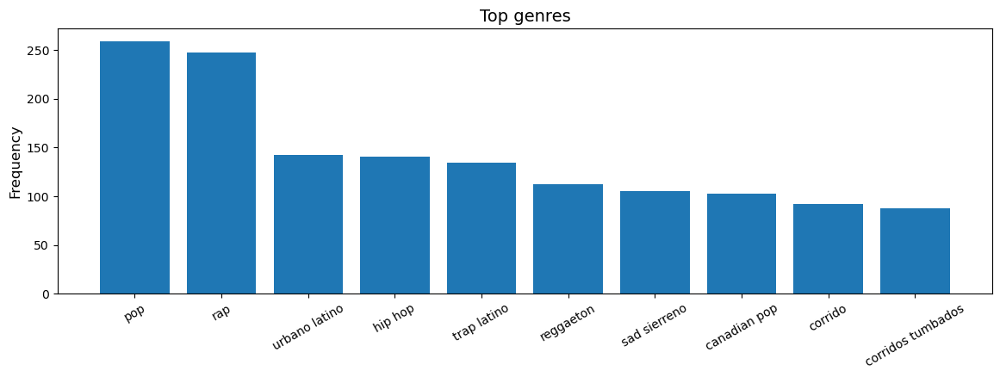

In [29]:
import matplotlib.pyplot as plt
%matplotlib inline

fig, ax = plt.subplots(figsize = (14,4))
ax.bar(to_1D(df_sampled['artist_genres']).value_counts().index[:10],
        to_1D(df_sampled['artist_genres']).value_counts().values[:10])
ax.set_ylabel("Frequency", size = 12)
ax.set_title("Top genres", size = 14)
plt.xticks(rotation=30)


In [74]:
import plotly.express as px
fig = px.bar(df_sampled, x=to_1D(df_sampled['artist_genres']).value_counts().index[:20], 
             y=to_1D(df_sampled['artist_genres']).value_counts().values[:20], 
             text_auto='.2s',title="Top genres and the number of songs",
            labels={
                     "x": "Genres",
                     "y": "Frequency",
                 },)
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig.show()

# ax.bar(to_1D(df_sampled['artist_genres']).value_counts().index[:10],
#         to_1D(df_sampled['artist_genres']).value_counts().values[:10])
# ax.set_ylabel("Frequency", size = 12)
# ax.set_title("Top genres", size = 14)

In [31]:

fig = px.imshow(df_sampled.corr(), text_auto='.2f',color_continuous_scale='RdBu_r', aspect="auto")
fig.update_layout(
    showlegend = False,
    width = 900, height = 700,
    autosize = False )
fig.show()

/var/folders/vm/x2_vk0wd59779rs1fx9tt8040000gn/T/ipykernel_1808/2544577261.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



1. Genre Distinctions and Attributes:
* How do song attributes like tempo, key, and loudness vary across genres?
* What attributes make a genre unique or distinguishable from others?
2. Popularity and Trends:
* Which song attributes correlate most strongly with a song's popularity?
* How have song attributes evolved over the decades? For example, has song duration or loudness changed over time?
* Can we predict the potential success of a song based on its attributes?
3. Artists and Their Signature Styles:
* Do established artists have a consistent pattern or "signature" in their song attributes?
* How do new or emerging artists compare with veterans in terms of song metadata?
4. Lyrics and Song Attributes:
* How do instrumental songs differ in attributes compared to lyric-heavy songs?
* Does the language or origin of the song (e.g., English vs. Spanish, Western vs. Eastern) influence its attributes?
5. Clustering and Recommendation:
* Can we develop clusters of songs that might cater to similar audiences based on their attributes?
* How do song recommendations work in terms of song metadata? Can we devise a basic recommendation algorithm?
* Are there outliers in the dataset, songs that defy typical attributes of their genre or era?


# How do song attributes like tempo, key, and loudness vary across genres?

In [76]:
import plotly.express as px
import pandas as pd

# Assume df is your DataFrame containing the relevant data

# Create box plot for tempo
fig_tempo = px.box(df_sampled, x='flattened_genres', y='tempo', title='Variation of Tempo Across Genres')

# Create box plot for key
fig_key = px.box(df_sampled, x='flattened_genres', y='key', title='Variation of Key Across Genres')

# Create box plot for loudness
fig_loudness = px.box(df_sampled, x='flattened_genres', y='loudness', title='Variation of Loudness Across Genres')

# Display the figures
fig_tempo.show()
fig_key.show()
fig_loudness.show()


In [53]:
to_1D(df_sampled['artist_genres']).value_counts()

pop                259
rap                247
urbano latino      142
hip hop            141
trap latino        134
                  ... 
bubblegum dance      1
eurodance            1
urbano chileno       1
mambo chileno        1
scam rap             1
Length: 247, dtype: int64

<Axes: xlabel='flattened_genres,key'>

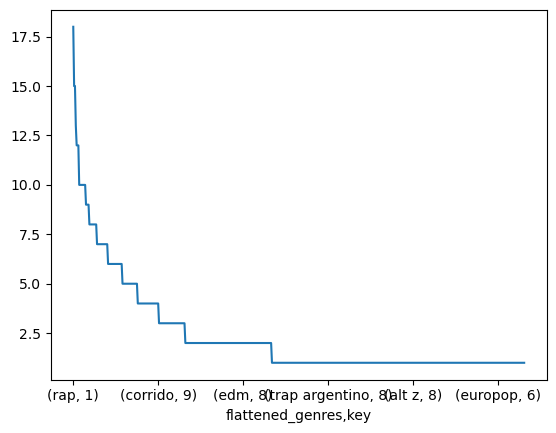

In [58]:
(df_sampled[['flattened_genres','key']].value_counts()).plot()

In [55]:
fig = px.strip(df_sampled, x='flattened_genres', y='key')
fig.show()

In [81]:
df_sampled['Genre']

0       c
1       m
2       c
3       c
4       c
       ..
1447    v
1448    r
1449    h
1450    m
1451    p
Name: Genre, Length: 1263, dtype: object

In [85]:
df_sampled['flattened_genres'].value_counts().head(25).index

Index(['pop', 'rap', 'hip hop', 'urbano latino', 'trap latino', 'sad sierreno',
       'reggaeton', 'corridos tumbados', 'corrido', 'modern country pop',
       'pop rap', 'sierreno', 'contemporary country', 'canadian pop',
       'canadian hip hop', 'trap', 'musica mexicana',
       'classic oklahoma country', 'atl hip hop', 'rage rap', 'k-pop',
       'melodic rap', 'reggaeton colombiano', 'slap house', 'pov: indie'],
      dtype='object')

In [87]:
import plotly.express as px
import pandas as pd

# Assuming your DataFrame is named 'df'
# Replace 'flattened_genres' with the actual column containing genre information

# Split the flattened_genres column into individual genres
# df['Genre'] = df['flattened_genres'].apply(lambda x: x[0] if x else None)

# Calculate the top 25 genres
top_genres = df_sampled['flattened_genres'].value_counts().head(25).index

# Filter the DataFrame for the top 25 genres
df_top_genres = df_sampled[df_sampled['flattened_genres'].isin(top_genres)]

# Create violin plots for tempo, key, and loudness across the top 25 genres
fig_tempo = px.box(df_top_genres, x='flattened_genres', y='tempo', title='Variation of Tempo Across Top 25 Genres')
fig_key = px.box(df_top_genres, x='flattened_genres', y='key', title='Variation of Key Across Top 25 Genres')
fig_loudness = px.box(df_top_genres, x='flattened_genres', y='loudness', title='Variation of Loudness Across Top 25 Genres')

# Show the plots
fig_tempo.show()
fig_key.show()
fig_loudness.show()



In [96]:
# Select the attributes to analyze
selected_attributes = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

# Add 'Genre' to the selected attributes
selected_attributes_with_genre = ['flattened_genres'] + selected_attributes
selected_attributes_with_genre


['Genre',
 'danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo']

In [97]:
df_selected_attributes = df_sampled[selected_attributes_with_genre]
df_selected_attributes

,Genre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,c,0.429,0.453,0,-7.746,1,0.0459,0.5540,0.000002,0.102,0.1550,77.639
1,m,0.429,0.453,0,-7.746,1,0.0459,0.5540,0.000002,0.102,0.1550,77.639
2,c,0.663,0.670,8,-8.399,1,0.2710,0.0464,0.000089,0.205,0.1380,136.952
3,c,0.663,0.670,8,-8.399,1,0.2710,0.0464,0.000089,0.205,0.1380,136.952
4,c,0.504,0.308,9,-14.958,1,0.0321,0.8680,0.135000,0.158,0.1210,113.950
...,...,...,...,...,...,...,...,...,...,...,...,...
1447,v,0.801,0.517,2,-8.205,0,0.2690,0.4940,0.000001,0.355,0.9230,160.254
1448,r,0.801,0.517,2,-8.205,0,0.2690,0.4940,0.000001,0.355,0.9230,160.254
1449,h,0.461,0.411,5,-9.259,0,0.0451,0.5360,0.000000,0.146,0.0944,86.520
1450,m,0.461,0.411,5,-9.259,0,0.0451,0.5360,0.000000,0.146,0.0944,86.520


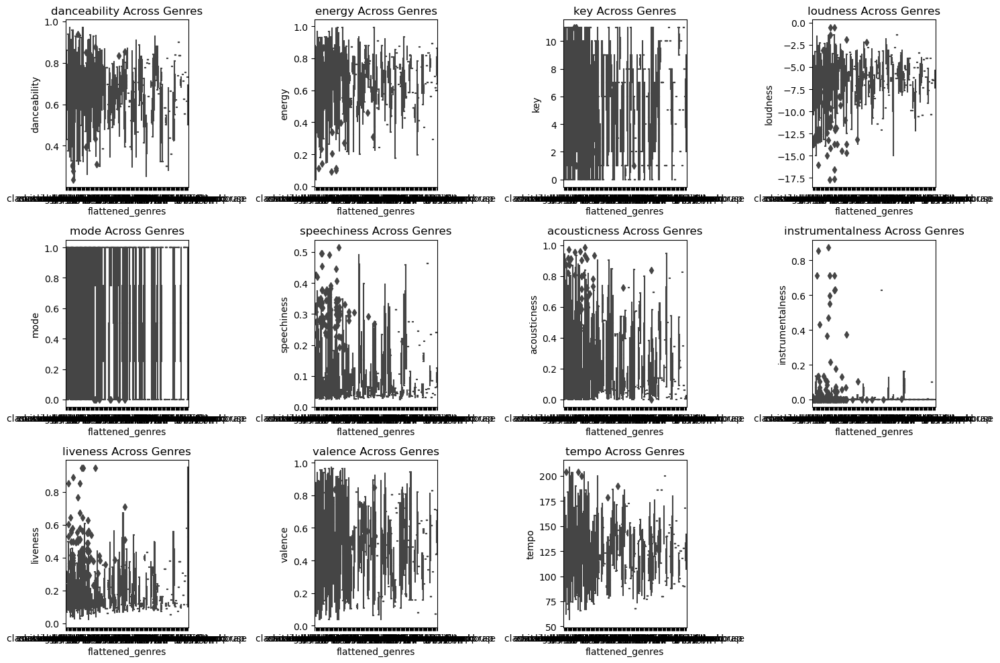

In [99]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'df'

# Select the attributes to analyze
selected_attributes = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

# Add 'Genre' to the selected attributes
selected_attributes_with_genre = ['flattened_genres'] + selected_attributes

# Select a subset of the DataFrame with the selected attributes
df_selected_attributes = df_sampled[selected_attributes_with_genre]

# Create box plots for each attribute, grouped by genre
plt.figure(figsize=(15, 10))
for attribute in selected_attributes:
    plt.subplot(3, 4, selected_attributes.index(attribute) + 1)
    sns.boxplot(x='flattened_genres', y=attribute, data=df_selected_attributes)
    plt.title(f'{attribute} Across Genres')

plt.tight_layout()
plt.show()


df_selected_attributes_melted = pd.melt(df_selected_attributes, id_vars='flattened_genres', value_vars=selected_attributes, var_name='Attribute', value_name='Value')

# Create box plots using Plotly Express
fig = px.box(df_selected_attributes_melted, x='Attribute', y='Value', color='flattened_genres', points='all', title='Attributes Across Genres',
             labels={'Attribute': 'Attribute', 'Value': 'Value', 'flattened_genres': 'Genre'})
fig.update_layout(xaxis=dict(type='category'))

# Show the plot
fig.show()



In [100]:
# df_selected_attributes_melted = pd.melt(df_selected_attributes, id_vars='flattened_genres', value_vars=selected_attributes, var_name='Attribute', value_name='Value')


# Get the top 25 genres based on track count
top_genres = df_sampled['flattened_genres'].value_counts().nlargest(25).index

# Filter the DataFrame for the top 25 genres
df_selected_attributes_melted_top25 = df_selected_attributes_melted[df_selected_attributes_melted['flattened_genres'].isin(top_genres)]

# Create box plots using Plotly Express
fig = px.box(df_selected_attributes_melted_top25, x='Attribute', y='Value', color='flattened_genres', points='all', title='Top 25 Genres: Attributes Across Genres',
             labels={'Attribute': 'Attribute', 'Value': 'Value', 'flattened_genres': 'Genre'})
fig.update_layout(xaxis=dict(type='category'))

# Show the plot
fig.show()


In [120]:
import pandas as pd
import plotly.express as px

# Assuming your DataFrame is named 'df'

# Select the attributes to analyze
selected_attributes = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

# Add 'Genre' to the selected attributes
selected_attributes_with_genre = ['flattened_genres'] + selected_attributes

# Select a subset of the DataFrame with the selected attributes
df_selected_attributes = df_sampled[selected_attributes_with_genre]

# Melt the DataFrame for easy plotting with Plotly
df_selected_attributes_melted = pd.melt(df_selected_attributes, id_vars='flattened_genres', value_vars=selected_attributes, var_name='Attribute', value_name='Value')

# Get the top 25 genres based on track count
top_genres = df_sampled['flattened_genres'].value_counts().nlargest(25).index

# Filter the DataFrame for the top 25 genres
df_selected_attributes_melted_top25 = df_selected_attributes_melted[df_selected_attributes_melted['flattened_genres'].isin(top_genres)]

# Create box plots using Plotly Express
fig = px.box(df_selected_attributes_melted_top25, x='Attribute', y='Value', color='flattened_genres', points='all', title='Top 25 Genres: Attributes Across Genres',
             labels={'Attribute': 'Attribute', 'Value': 'Value', 'Genre': 'Genre'})
fig.update_layout(xaxis=dict(type='category'))

# Show the plot
fig.show()


In [112]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Assuming your DataFrame is named 'df'

# Select attributes for analysis
selected_attributes = ['danceability', 'energy', 'loudness', 'tempo']

# Define colors for each attribute
colors = ['blue', 'green', 'red', 'purple']

# Create subplots
fig = make_subplots(rows=len(selected_attributes), cols=1, subplot_titles=selected_attributes)

# Iterate through selected attributes
for i, (attribute, color) in enumerate(zip(selected_attributes, colors), start=1):
    # Create box plot for the current attribute with color
    box_trace = go.Box(x=df_sampled['flattened_genres'], y=df_sampled[attribute], name=attribute, marker_color=color)
    
    # Add the box trace to the subplot
    fig.add_trace(box_trace, row=i, col=1)

# Update layout
fig.update_layout(height=1000, width=1000, title_text='Audio Feature Comparison Across Genres', showlegend=False)

# Show the plot
fig.show()


In [116]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Assuming your DataFrame is named 'df'

# Select the top 25 features based on some criteria
top_features = df_sampled.mean().sort_values(ascending=False).head(10).index.tolist()

# Define colors for each feature
colors = ['blue', 'green', 'red', 'purple', 'orange', 'yellow', 'pink', 'brown', 'cyan', 'magenta', 'grey', 'olive', 'lime', 'teal', 'maroon', 'navy', 'peru', 'indigo', 'orchid', 'darkorange', 'dodgerblue', 'darkgreen', 'rosybrown', 'goldenrod']

# Create subplots
fig = make_subplots(rows=len(top_features), cols=1, subplot_titles=top_features)

# Iterate through top features
for i, (feature, color) in enumerate(zip(top_features, colors), start=1):
    # Create box plot for the current feature with color
    box_trace = go.Box(x=df_sampled['flattened_genres'], y=df_sampled[feature], name=feature, marker_color=color)
    
    # Add the box trace to the subplot
    fig.add_trace(box_trace, row=i, col=1)

# Update layout
fig.update_layout(height=1500, width=1000, title_text='Top 25 Audio Features Across Genres', showlegend=False)

# Show the plot
fig.show()


/var/folders/vm/x2_vk0wd59779rs1fx9tt8040000gn/T/ipykernel_1808/960737651.py:7: FutureWarning:

The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



In [107]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Assuming your DataFrame is named 'df'

# Select the attributes to analyze
selected_attributes = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

# Get the top 25 genres based on track count
top_genres = df_sampled['flattened_genres'].value_counts().nlargest(25).index

# Create subplots
fig = make_subplots(rows=len(selected_attributes), cols=1, subplot_titles=selected_attributes, shared_xaxes=True)

# Iterate through attributes and create box plots for each
for i, attribute in enumerate(selected_attributes, start=1):
    # Select a subset of the DataFrame with the selected attribute
    df_selected_attribute = df_sampled[df_sampled['flattened_genres'].isin(top_genres)][['flattened_genres', attribute]]
    
    # Melt the DataFrame for easy plotting with Plotly
    df_selected_attribute_melted = pd.melt(df_selected_attribute, id_vars='flattened_genres', value_vars=attribute, var_name='Attribute', value_name='Value')
    
    # Create box plots for the attribute
    trace = go.Box(x=df_selected_attribute_melted['flattened_genres'], y=df_selected_attribute_melted['Value'], name=attribute)
    fig.add_trace(trace, row=i, col=1)

# Update layout
fig.update_layout(title_text='Top 25 Genres: Attributes Across Genres', showlegend=False)

# Show the plot
fig.show()


In [130]:
import pandas as pd

# Assuming your DataFrame is named 'df'
correlation_matrix = df_sampled.corr()

# Get the correlation of each attribute with 'popularity'
popularity_correlation = correlation_matrix['track_popularity']

# Sort the correlation values in descending order
sorted_correlation = popularity_correlation.abs().sort_values(ascending=False)

# Display the top correlated attributes
top_correlated_attributes = sorted_correlation.head(10)  # You can adjust the number of top attributes
print(top_correlated_attributes)


track_popularity      1.000000
album_total_tracks    0.499927
track_number          0.387888
artist_followers      0.237892
duration_ms           0.121518
danceability          0.105937
valence               0.094558
acousticness          0.084583
artist_popularity     0.078954
energy                0.069023
Name: track_popularity, dtype: float64


/var/folders/vm/x2_vk0wd59779rs1fx9tt8040000gn/T/ipykernel_1808/2049698072.py:4: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



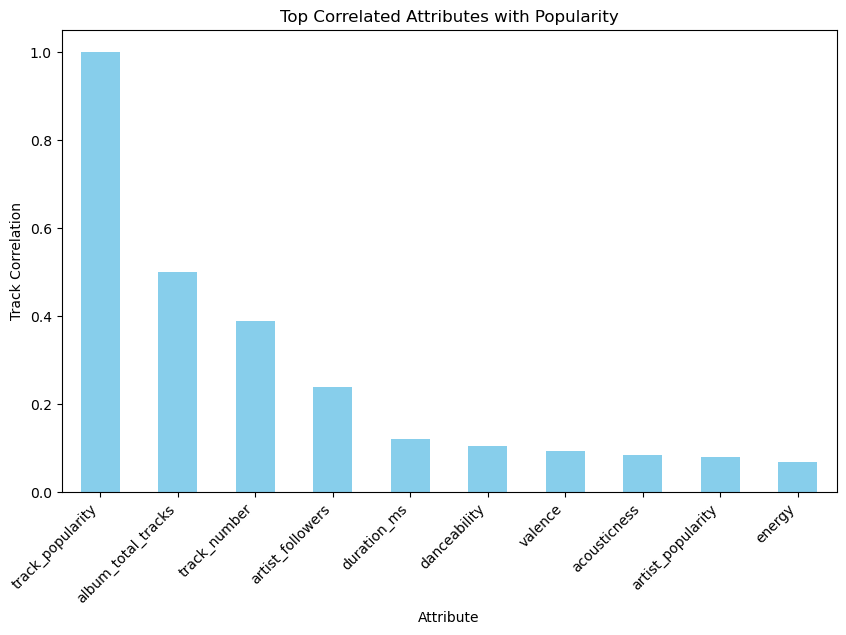

In [131]:

# Plot the correlations
plt.figure(figsize=(10, 6))
top_correlated_attributes.plot(kind='bar', color='skyblue')
plt.title('Top Correlated Attributes with Popularity')
plt.xlabel('Attribute')
plt.ylabel('Track Correlation')
plt.xticks(rotation=45, ha='right')
plt.show()







In [132]:
fig = px.bar(x=top_correlated_attributes.index, y=top_correlated_attributes.values, title='Top Correlated Attributes with Popularity')
fig.update_layout(xaxis_title='Attribute', yaxis_title='Correlation', xaxis_tickangle=-45)
fig.show()

Index(['artist_id', 'artist_name', 'artist_popularity', 'artist_followers',
       'artist_genres', 'song_id', 'song_name', 'album_id', 'album_name',
       'track_popularity', 'track_available_markets', 'duration_ms',
       'track_number', 'album_release_date', 'album_total_tracks',
       'album_type_y', 'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature'],
      dtype='object')

In [144]:
drop_df

In [145]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
drop_df = df_sampled.dropna()
# Assuming X contains features and y is the target variable
X = drop_df[['artist_popularity', 'artist_followers',
       'duration_ms',
       'track_number','album_total_tracks',
        'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature']]
y = drop_df['track_popularity']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')


Mean Squared Error: 241.48265613193107


In [148]:
track_audio_features_df.columns

Index(['artists', 'available_markets', 'disc_number', 'duration_ms_x',
       'explicit', 'href', 'id', 'is_local', 'name', 'popularity',
       'preview_url', 'track_number', 'type_x', 'uri_x', 'album.album_type',
       'album.artists', 'album.available_markets',
       'album.external_urls.spotify', 'album.href', 'album.id', 'album.images',
       'album.name', 'album.release_date', 'album.release_date_precision',
       'album.total_tracks', 'album.type', 'album.uri', 'external_ids.isrc',
       'external_urls.spotify', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'type_y', 'uri_y', 'track_href', 'analysis_url',
       'duration_ms_y', 'time_signature'],
      dtype='object')

In [149]:
import plotly.express as px

# Assuming 'df' is your DataFrame
# Assuming 'established_threshold' is your criterion for established artists

# Filter data for established artists
established_artists_df = df_sampled[df_sampled['artist_popularity'] > 70]

# Aggregate data
artist_summary = established_artists_df.groupby('artist_name').mean().reset_index()

# Create a parallel coordinates plot
fig = px.parallel_coordinates(
    artist_summary,
    dimensions=['danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo'],
    color='artist_popularity',  # You can change this to another attribute
    labels={'artist_popularity': 'Popularity'},
    title='Song Attributes of Established Artists'
)

fig.show()


/var/folders/vm/x2_vk0wd59779rs1fx9tt8040000gn/T/ipykernel_1808/1355602383.py:10: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/Users/priscilladanso/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



In [224]:
import pandas as pd
import plotly.express as px

# Assuming your dataset is named df
unique_top_artists = df_sampled[['artist_name', 'artist_popularity', 'artist_genres']].explode('artist_genres').drop_duplicates().head(30)

# Display the unique top 10 artists
print("Unique Top 10 Artists:")
print(unique_top_artists)
unique_top_artists = unique_top_artists[unique_top_artists['artist_popularity'] > 80]

# Visualize the genres associated with the unique top artists
fig = px.bar(unique_top_artists['artist_genres'].value_counts().reset_index(),
             x='index',
             y='artist_genres',
#              color='artist_name',
             labels={'index': 'Genres', 'artist_genres': 'Count'},
             title='Genres Associated with Unique Top 10 Artists',
             )

fig.update_xaxes(tickangle=45)
fig.show()

# Explore signature styles of the unique top artists (you can analyze audio features, etc.)
# For example, let's visualize the danceability of their tracks
fig = px.box(df_sampled[df_sampled['artist_name'].isin(unique_top_artists['artist_name'])],
             x='artist_name',
             y='danceability',
#              color='artist_name',
             labels={'artist_name': 'Artist', 'danceability': 'Danceability'},
             title='Danceability Across Unique Top 10 Artists',
             )

fig.update_xaxes(tickangle=45)
fig.show()


Unique Top 10 Artists:
        artist_name  artist_popularity             artist_genres
0        Zach Bryan               86.0  classic oklahoma country
0        Zach Bryan               86.0        modern country pop
1   Kacey Musgraves               74.0     classic texas country
1   Kacey Musgraves               74.0      contemporary country
1   Kacey Musgraves               74.0              country dawn
2             Drake               95.0          canadian hip hop
2             Drake               95.0              canadian pop
2             Drake               95.0                   hip hop
2             Drake               95.0                   pop rap
2             Drake               95.0                       rap
3              Yeat               81.0                   pluggnb
3              Yeat               81.0                  rage rap
4            Mitski               81.0            brooklyn indie
4            Mitski               81.0                pov: indie
5 

In [222]:
import pandas as pd
import plotly.express as px

# Assuming your dataset is named df
# Ensure 'artist_genres' is a list of genres for each artist
# Example:
# df = pd.DataFrame({
#     'artist_name': ['Artist1', 'Artist2', 'Artist3'],
#     'artist_genres': [['Pop', 'Rock'], ['Hip Hop', 'R&B'], ['Electronic', 'Dance']]
# })

# Explode the genres into separate rows
df_exploded = df_sampled.explode('artist_genres')
df_exploded = df_exploded[df_exploded['artist_popularity'] > 85]
# Group by artist and genre to get the count
genre_counts = df_exploded.groupby(['artist_name', 'artist_genres']).size().reset_index(name='count')

# Create a bar chart
fig = px.bar(genre_counts, x='artist_name', y='count', color='artist_genres',
             labels={'artist_name': 'Artist', 'count': 'Genre Count', 'artist_genres': 'Genre'},
             title='Genre Distribution Across Artists',
             )

fig.update_xaxes(tickangle=45)
fig.show()


In [220]:
import pandas as pd
import plotly.express as px

# Assuming your dataset is named df
# Ensure 'artist_genres' is a list of genres for each artist
# Example:
# df = pd.DataFrame({
#     'artist_name': ['Artist1', 'Artist2', 'Artist3'],
#     'artist_genres': [['Pop', 'Rock'], ['Hip Hop', 'R&B'], ['Electronic', 'Dance']],
#     'artist_popularity': [80, 90, 85],
#     'artist_followers': [1000000, 2000000, 1500000]
# })

# Count the number of genres for each artist
df_sampled['num_genres'] = df_sampled['artist_genres'].apply(lambda x: len(x))

# Create a scatter plot
fig = px.scatter(df_sampled, x='num_genres', y='artist_popularity', size='artist_followers',
                 color='num_genres', hover_name='artist_name',
                 labels={'num_genres': 'Number of Genres', 'artist_popularity': 'Artist Popularity', 'artist_followers': 'Artist Followers'},
                 title='Correlation of Number of Genres with Popularity and Followers',
                 )

fig.show()


In [156]:
import plotly.express as px

# Assuming your DataFrame is named 'df'
fig = px.scatter_matrix(
    df_sampled,
    dimensions=['danceability', 'energy', 'key', 'loudness',
       'speechiness', 'acousticness', 'liveness',
       'valence', 'tempo'],
    color="artist_popularity",
    title="Scatter Plot Matrix of Song Attributes vs. Popularity",
    labels={"artist_popularity": "Popularity"}
)

# Update layout for better readability
fig.update_layout(
    height=1000,
    width=1000,
)

# Show the plot
fig.show()


/Users/priscilladanso/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



In [158]:
import plotly.express as px

# Assuming your DataFrame is named 'df'
fig = px.scatter_3d(
    df_sampled,
    x="danceability",
    y="energy",
    z="valence",
    color="artist_popularity",
    title="3D Scatter Plot of Song Attributes vs. Popularity",
    labels={"artist_popularity": "Popularity"}
)

# Update layout for better readability
fig.update_layout(
    height=800,
    width=800,
)

# Show the plot
fig.show()


In [160]:
df_sampled

,artist_id,artist_name,artist_popularity,artist_followers,artist_genres,song_id,song_name,album_id,album_name,track_popularity,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,40ZNYROS4zLfyyBSs2PGe2,Zach Bryan,86.0,2484367.0,"[classic oklahoma country, modern country pop]",4KULAymBBJcPRpk1yO4dOG,I Remember Everything (feat. Kacey Musgraves),6PbnGueEO6LGodPfvNldYf,Zach Bryan,93,...,0,-7.746,1,0.0459,0.5540,0.000002,0.102,0.1550,77.639,4
1,70kkdajctXSbqSMJbQO424,Kacey Musgraves,74.0,1252361.0,"[classic texas country, contemporary country, ...",4KULAymBBJcPRpk1yO4dOG,I Remember Everything (feat. Kacey Musgraves),6PbnGueEO6LGodPfvNldYf,Zach Bryan,93,...,0,-7.746,1,0.0459,0.5540,0.000002,0.102,0.1550,77.639,4
2,3TVXtAsR1Inumwj472S9r4,Drake,95.0,81392636.0,"[canadian hip hop, canadian pop, hip hop, pop ...",2YSzYUF3jWqb9YP9VXmpjE,IDGAF (feat. Yeat),4czdORdCWP9umpbhFXK2fW,For All The Dogs,94,...,8,-8.399,1,0.2710,0.0464,0.000089,0.205,0.1380,136.952,4
3,3qiHUAX7zY4Qnjx8TNUzVx,Yeat,81.0,3426657.0,"[pluggnb, rage rap]",2YSzYUF3jWqb9YP9VXmpjE,IDGAF (feat. Yeat),4czdORdCWP9umpbhFXK2fW,For All The Dogs,94,...,8,-8.399,1,0.2710,0.0464,0.000089,0.205,0.1380,136.952,4
4,2uYWxilOVlUdk4oV9DvwqK,Mitski,81.0,5568028.0,"[brooklyn indie, pov: indie]",3vkCueOmm7xQDoJ17W1Pm3,My Love Mine All Mine,2Cn1d2KgbkAqbZCJ1RzdkA,The Land Is Inhospitable and So Are We,97,...,9,-14.958,1,0.0321,0.8680,0.135000,0.158,0.1210,113.950,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1447,716NhGYqD1jl2wI1Qkgq36,Bizarrap,84.0,13086837.0,"[argentine hip hop, pop venezolano, trap argen...",4SW9gHnW8NfKOdqmh0ij45,Fruto,4NMv3cMkDwkkR6EdLloQDB,en dormir sin Madrid,91,...,2,-8.205,0,0.2690,0.4940,0.000001,0.355,0.9230,160.254,4
1448,19HM5j0ULGSmEoRcrSe5x3,Milo j,81.0,1373051.0,[trap argentino],4SW9gHnW8NfKOdqmh0ij45,Fruto,4NMv3cMkDwkkR6EdLloQDB,en dormir sin Madrid,91,...,2,-8.205,0,0.2690,0.4940,0.000001,0.355,0.9230,160.254,4
1449,3TVXtAsR1Inumwj472S9r4,Drake,95.0,81392636.0,"[canadian hip hop, canadian pop, hip hop, pop ...",6KMbZt7u6AlDia2NPO0Liv,Slime You Out (feat. SZA),35nmDyrcnDY4B1ISYpKEEs,For All The Dogs,73,...,5,-9.259,0,0.0451,0.5360,0.000000,0.146,0.0944,86.520,3
1450,7tYKF4w9nC0nq9CsPZTHyP,SZA,87.0,15522335.0,"[pop, r&b, rap]",6KMbZt7u6AlDia2NPO0Liv,Slime You Out (feat. SZA),35nmDyrcnDY4B1ISYpKEEs,For All The Dogs,73,...,5,-9.259,0,0.0451,0.5360,0.000000,0.146,0.0944,86.520,3


In [166]:
import plotly.express as px

# Assuming your DataFrame is named 'df'
top_three_genres = df_sampled['flattened_genres'].value_counts().head(3).index

fig = px.parallel_coordinates(
    df_sampled[df_sampled['flattened_genres'].isin(top_three_genres)],
    dimensions=['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo'],
#     color='flattened_genres',
    color_continuous_scale=px.colors.sequential.Viridis,
    labels={'flattened_genres': 'Genre'}
)

# Show the plot
fig.show()


/Users/priscilladanso/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



In [173]:
import plotly.express as px

# Assuming your dataset is stored in 'df'
fig = px.box(df_top_genres, x='flattened_genres', y='tempo', points='all', title='Tempo Distribution Across Genres')
fig.update_layout(xaxis_title='Genre', yaxis_title='Tempo')
fig.show()


In [172]:
import plotly.express as px

# Assuming your dataset is stored in 'df'
fig = px.box(df_top_genres, x='flattened_genres', y='danceability', points='all', title='Danceability Across Genres')
fig.update_layout(xaxis_title='Genre', yaxis_title='Danceability')
fig.show()

# Repeat for valence
fig = px.box(df_top_genres, x='flattened_genres', y='valence', points='all', title='Valence Across Genres')
fig.update_layout(xaxis_title='Genre', yaxis_title='Valence')
fig.show()


In [171]:
# Assuming 'genre' is the column in your dataset representing genres
top_genres = df_sampled['flattened_genres'].value_counts().head(10).index
# df_sampled, x='flattened_genres'
# Filter the dataset for the top 10 genres
df_top_genres = df_sampled[df_sampled['flattened_genres'].isin(top_genres)]

# Plot danceability
fig = px.box(df_top_genres, x='flattened_genres', y='danceability', points='all', title='Danceability Across Top 10 Genres')
fig.update_layout(xaxis_title='Genre', yaxis_title='Danceability')
fig.show()

# Plot valence
fig = px.box(df_top_genres, x='flattened_genres', y='valence', points='all', title='Valence Across Top 10 Genres')
fig.update_layout(xaxis_title='Genre', yaxis_title='Valence')
fig.show()


In [174]:
import plotly.express as px

# Assuming 'genre' is the column in your dataset representing genres
# top_genres = df['genre'].value_counts().head(10).index

# # Filter the dataset for the top 10 genres
# df_top_genres = df[df['genre'].isin(top_genres)]

# Plot key
fig = px.box(df_top_genres, x='flattened_genres', y='key', points='all', title='Key Across Top 10 Genres')
fig.update_layout(xaxis_title='Genre', yaxis_title='Key')
fig.show()

# Plot mode
fig = px.box(df_top_genres, x='flattened_genres', y='mode', points='all', title='Mode Across Top 10 Genres')
fig.update_layout(xaxis_title='Genre', yaxis_title='Mode')
fig.show()

# Plot acousticness
fig = px.box(df_top_genres, x='flattened_genres', y='acousticness', points='all', title='Acousticness Across Top 10 Genres')
fig.update_layout(xaxis_title='Genre', yaxis_title='Acousticness')
fig.show()


In [175]:
# Plot speechiness
fig = px.box(df_top_genres, x='flattened_genres', y='speechiness', points='all', title='Speechiness Across Top 10 Genres')
fig.update_layout(xaxis_title='Genre', yaxis_title='Speechiness')
fig.show()

# Plot valence
fig = px.box(df_top_genres, x='flattened_genres', y='valence', points='all', title='Valence Across Top 10 Genres')
fig.update_layout(xaxis_title='Genre', yaxis_title='Valence')
fig.show()

In [176]:
df_sampled.columns

Index(['artist_id', 'artist_name', 'artist_popularity', 'artist_followers',
       'artist_genres', 'song_id', 'song_name', 'album_id', 'album_name',
       'track_popularity', 'track_available_markets', 'duration_ms',
       'track_number', 'album_release_date', 'album_total_tracks',
       'album_type_y', 'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'flattened_genres'],
      dtype='object')

In [184]:
import requests
from bs4 import BeautifulSoup

#function to scrape lyrics from genius
def scrape_lyrics(artistname, songname):
    artistname2 = str(artistname.replace(' ','-')) if ' ' in artistname else str(artistname)
    songname2 = str(songname.replace(' ','-')) if ' ' in songname else str(songname)
    page = requests.get('https://genius.com/'+ artistname2 + '-' + songname2 + '-' + 'lyrics')
    html = BeautifulSoup(page.text, 'html.parser')
    lyrics1 = html.find("div", class_="lyrics")
    lyrics2 = html.find("div", class_="Lyrics__Container-sc-1ynbvzw-2 jgQsqn")
    if lyrics1:
        lyrics = lyrics1.get_text()
    elif lyrics2:
        lyrics = lyrics2.get_text()
    elif lyrics1 == lyrics2 == None:
        lyrics = None
    return lyrics

#function to attach lyrics onto data frame
#artist_name should be inserted as a string
def lyrics_onto_frame(df1, artist_name):
    for i,x in enumerate(df1['song_name']):
        test = scrape_lyrics(artist_name, x)
        df1.loc[i, 'lyrics'] = test
    return df1

In [186]:
import requests
from bs4 import BeautifulSoup

# Function to scrape lyrics from genius
def scrape_lyrics(artist_name, song_name):
    artist_name2 = artist_name.replace(' ', '-')
    song_name2 = song_name.replace(' ', '-')
    url = f'https://genius.com/{artist_name2}-{song_name2}-lyrics'
    
    try:
        with requests.get(url) as response:
            response.raise_for_status()
            html = response.text
    except requests.RequestException as e:
        print(f"Error fetching {url}: {e}")
        return None

    soup = BeautifulSoup(html, 'html.parser')
    lyrics = soup.find("div", class_=["lyrics", "Lyrics__Container-sc-1ynbvzw-2 jgQsqn"])
    
    return lyrics.get_text() if lyrics else None

# Function to attach lyrics onto DataFrame
def lyrics_onto_frame(df, artist_name):
    for i, song_name in enumerate(df['song_name']):
        lyrics = scrape_lyrics(artist_name, song_name)
        df.loc[i, 'lyrics'] = lyrics
    return df


In [189]:
df_sampled.drop('lyrics', inplace=True, axis=1)

In [190]:
!pip install lyricsgenius


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.4/59.4 kB 3.6 MB/s eta 0:00:00


AttributeError: 'Series' object has no attribute 'style'

In [201]:
pd.set_option('display.max_colwidth', None)
df_sampled['lyrics']

0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

In [200]:
from bs4 import BeautifulSoup

def clean_lyrics(lyrics):
    # Use BeautifulSoup to parse HTML
    soup = BeautifulSoup(lyrics, 'html.parser')
    
    # Extract text content
    cleaned_lyrics = soup.get_text(separator='\n', strip=True)
    
    return cleaned_lyrics

# Apply the clean_lyrics function to the 'lyrics' column
df_sampled['lyrics'] = df_sampled['lyrics'].apply(clean_lyrics)


In [203]:
import pandas as pd
import lyricsgenius
# client_id = 'vVYfAVkseVZKPCGUXG-WWMW2rBGtKZadsLwsataxqgcK2dJNti1MnVroKGdfkwj0'
# client_secret = 'QuW8jjizNWtQyzUfc5F7eVrGBNo2ESxEk2tOuN-70aHsLF677cJW9OzG96G-EQA9L2WWhZaMACIs5VTGiKi_XA'
# Replace 'YOUR_ACCESS_TOKEN' with your Genius API access token
genius = lyricsgenius.Genius('afKGzRloyhMmiVMdRiFhdxeyEPketq5HNhgR2OggXp1c0U9Qt1IGmsvCmkzE9YZI')

def clean_lyrics(lyrics):
    # Use BeautifulSoup to parse HTML
    soup = BeautifulSoup(lyrics, 'html.parser')
    
    # Extract text content
    cleaned_lyrics = soup.get_text(separator='\n', strip=True)
    
    return cleaned_lyrics

# Function to retrieve lyrics for a batch of songs
def get_lyrics_batch(df, start_idx, end_idx):
    for i in range(start_idx, end_idx):
        artist_name = df.loc[i, 'artist_name']
        song_name = df.loc[i, 'song_name']
        try:
            # Search for the song
            song = genius.search_song(song_name, artist_name)

            # Add lyrics to the DataFrame
            if song:
                df.loc[i, 'lyrics'] = clean_lyrics(song.lyrics)
            else:
                df.loc[i, 'lyrics'] = None
        except Exception as e:
            print(f"Error processing song {song_name} by {artist_name}: {str(e)}")

# Load your DataFrame (replace 'your_data.csv' with your actual file)
# df = pd.read_csv('your_data.csv')

# Set the batch size
batch_size = 10

# Process the DataFrame in batches
for start_idx in range(0, len(df), batch_size):
    end_idx = min(start_idx + batch_size, len(df))
    get_lyrics_batch(df_sampled, start_idx, end_idx)

# Save the DataFrame with lyrics to a new CSV file
df.to_csv('your_data_with_lyrics.csv', index=False)


Searching for "I Remember Everything (feat. Kacey Musgraves)" by Zach Bryan...
Done.
Searching for "I Remember Everything (feat. Kacey Musgraves)" by Kacey Musgraves...
Done.
Searching for "IDGAF (feat. Yeat)" by Drake...
Done.
Searching for "IDGAF (feat. Yeat)" by Yeat...
Done.
Searching for "My Love Mine All Mine" by Mitski...
Done.
Searching for "fukumean" by Gunna...
Done.
Searching for "Paint The Town Red" by Doja Cat...
Done.
Searching for "greedy" by Tate McRae...
Done.
Searching for "MONACO" by Bad Bunny...
Done.
Searching for "First Person Shooter (feat. J. Cole)" by Drake...
Done.
Searching for "First Person Shooter (feat. J. Cole)" by J. Cole...
Done.
Searching for "vampire" by Olivia Rodrigo...
Done.
Searching for "I KNOW ?" by Travis Scott...
Done.
Searching for "Is It Over Now? (Taylor's Version) (From The Vault)" by Taylor Swift...
Done.
Searching for "Now That We Don't Talk (Taylor's Version) (From The Vault)" by Taylor Swift...
Done.
Searching for "bad idea right?" by 

Done.
Searching for "Wonderland (Taylor's Version)" by Taylor Swift...
Done.
Searching for "You Are In Love (Taylor's Version)" by Taylor Swift...
Done.
Searching for "Popular (with Playboi Carti & Madonna) - Music from the HBO Original Series" by The Weeknd...
Done.
Searching for "Popular (with Playboi Carti & Madonna) - Music from the HBO Original Series" by Playboi Carti...
Done.
Searching for "Popular (with Playboi Carti & Madonna) - Music from the HBO Original Series" by Madonna...
Done.
Searching for "Bad Blood (Taylor's Version)" by Taylor Swift...
Done.
Searching for "QLONA" by KAROL G...
Done.
Searching for "QLONA" by Peso Pluma...
Done.
Searching for "This Love (Taylor’s Version)" by Taylor Swift...
Done.
Searching for "Gently (feat. Bad Bunny)" by Drake...
Done.
Searching for "Gently (feat. Bad Bunny)" by Bad Bunny...
Done.
Searching for "Cowgirls (feat. ERNEST)" by Morgan Wallen...
Done.
Searching for "Cowgirls (feat. ERNEST)" by ERNEST...
Done.
Searching for "TULUM" by Pes

KeyError: 158

In [179]:
df_sampled.columns

Index(['artist_id', 'artist_name', 'artist_popularity', 'artist_followers',
       'artist_genres', 'song_id', 'song_name', 'album_id', 'album_name',
       'track_popularity', 'track_available_markets', 'duration_ms',
       'track_number', 'album_release_date', 'album_total_tracks',
       'album_type_y', 'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'flattened_genres'],
      dtype='object')

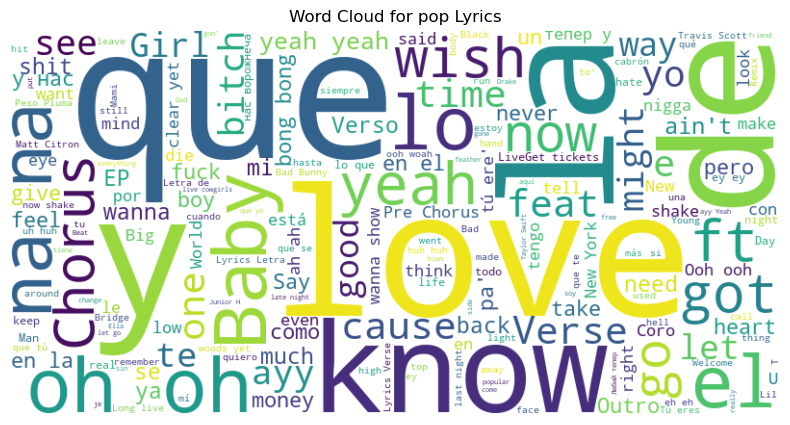

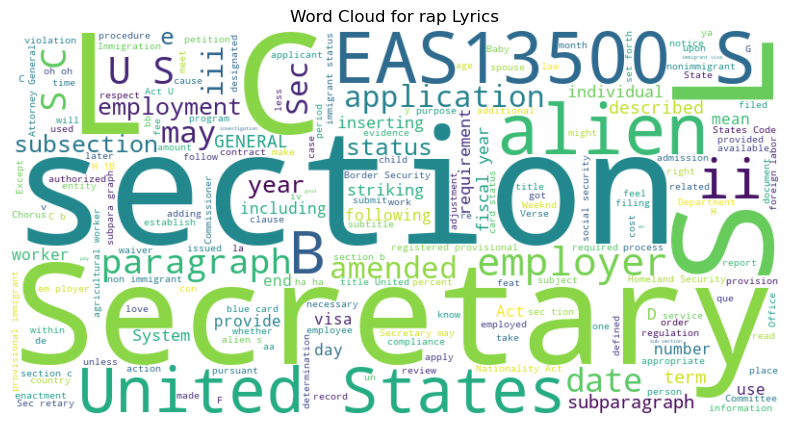

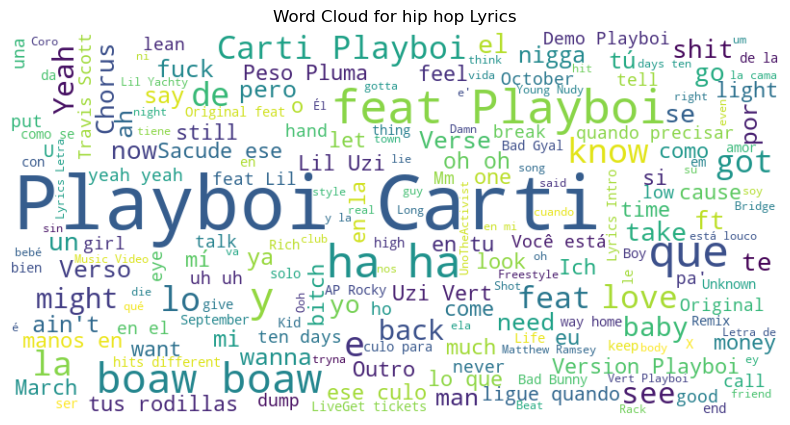

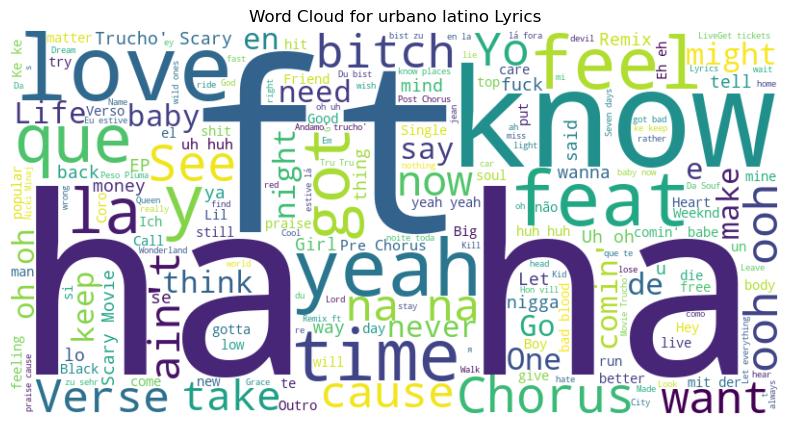

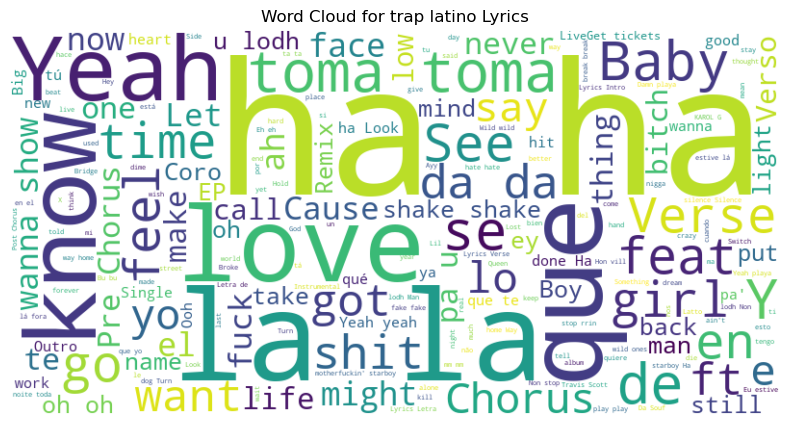

In [193]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'genre' and 'lyrics' are the columns in your dataset
# Adjust column names based on your actual dataset structure
df_lyrics = df_sampled[['flattened_genres', 'lyrics']]

# Function to generate word clouds for each genre
def generate_word_clouds(df, genres):
    for genre in genres:
        text = ' '.join(df_sampled[df_sampled['flattened_genres'] == genre]['lyrics'].astype(str))
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
        
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Word Cloud for {genre} Lyrics')
        plt.show()

# Assuming 'genre' is the column in your dataset representing genres
top_genres = df_sampled['flattened_genres'].value_counts().head(5).index

# Generate word clouds for the top 5 genres
generate_word_clouds(df_lyrics, top_genres)


In [239]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Assuming df is your dataset with audio features and popularity
# Ensure 'popularity' is your target variable
X = drop_df[['artist_popularity', 'artist_followers',
       'duration_ms',
        'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature']]
y = drop_df['track_popularity']
# Step 2: Split the data
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42)

# Step 3: Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 4: Model Selection
model = RandomForestRegressor()

# Step 5: Model Training
model.fit(X_train_scaled, y_train)

# Step 6: Model Evaluation
y_pred = model.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')


Mean Squared Error: 67.63947590091838


In [242]:
drop_df['track_popularity'].max()

99

In [236]:
from sklearn.metrics import mean_squared_error

# Assuming y_test contains actual popularity scores and y_pred contains predicted scores
mse_test = mean_squared_error(y_test, y_pred)

# Optionally, calculate baseline MSE (e.g., predicting the mean popularity for all samples)
baseline_mse = mean_squared_error(y_test, [y_train.mean()] * len(y_test))

# Calculate the difference
mse_difference = baseline_mse - mse_test

print(f'MSE on Test Set: {mse_test}')
print(f'Baseline MSE: {baseline_mse}')
print(f'Difference: {mse_difference}')


MSE on Test Set: 68.85312749188898
Baseline MSE: 344.17650216033223
Difference: 275.32337466844325


In [270]:
from sklearn import metrics
import numpy as np

print('Mean Absolute Error (MAE):', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error (MSE):', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error (RMSE):', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
mape = np.mean(np.abs((y_test - y_pred) / np.abs(y_test)))
print('Mean Absolute Percentage Error (MAPE):', round(mape * 100, 2))
print('Accuracy:', round(100*(1 - mape), 2))

Mean Absolute Error (MAE): 4.870008218834306
Mean Squared Error (MSE): 67.63947590091838
Root Mean Squared Error (RMSE): 8.224322215290352
Mean Absolute Percentage Error (MAPE): inf
Accuracy: -inf


In [237]:
ml_df = drop_df[['artist_popularity', 'artist_followers',
       'duration_ms',
        'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature']]

/Users/priscilladanso/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



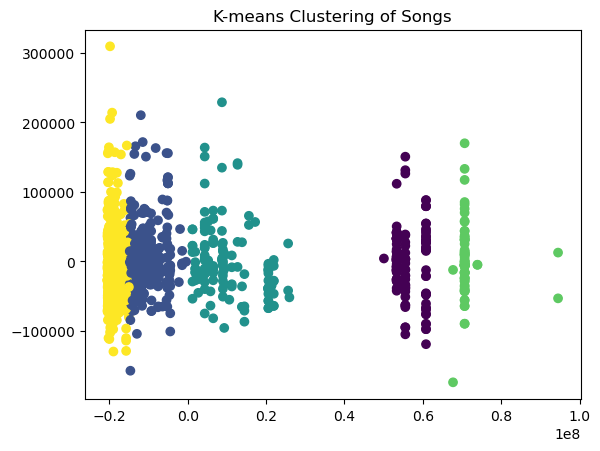

In [275]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Assume X is your feature matrix
# X = ...

# Choose the number of clusters (K)
k = 5

# Apply K-means clustering
kmeans = KMeans(n_clusters=k)
clusters = kmeans.fit_predict(X)

# Visualize clusters (for example, using PCA for dimensionality reduction)
# Note: Adjust the code based on your actual feature matrix and visualization needs
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='viridis')
plt.title('K-means Clustering of Songs')
plt.show()

fig = px.scatter(X_pca, x=X_pca[:, 0], y=X_pca[:, 1], color=clusters)
fig.show()

In [272]:
clusters

array([0, 0, 1, ..., 1, 4, 4], dtype=int32)

In [276]:
drop_df['cluster'] = kmeans.fit_predict(X)

cluster_characteristics = drop_df.groupby('cluster').mean()  # or 'median'
fig = px.bar(cluster_characteristics.T, barmode='group', title='Cluster Characteristics')
fig.show()



/Users/priscilladanso/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/var/folders/vm/x2_vk0wd59779rs1fx9tt8040000gn/T/ipykernel_1808/2878682105.py:3: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [278]:
importance = kmeans.feature_importances_  # Replace 'model' with your trained model
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importance})
feature_importance_df

AttributeError: 'KMeans' object has no attribute 'feature_importances_'

In [264]:
from sklearn.metrics import silhouette_score

# silhouette_score(X_train_scaled, kmeans.labels_, metric='euclidean')

K = range(2, 8)
fits = []
score = []


for k in K:
    # train the model for current value of k on training data
    model = KMeans(n_clusters = k, random_state = 0, n_init='auto').fit(X)
    
    # append the model to fits
    fits.append(model)
    
    # Append the silhouette score to scores
    score.append(silhouette_score(X, model.labels_, metric='euclidean'))

In [265]:
fits

[KMeans(n_clusters=2, n_init='auto', random_state=0),
 KMeans(n_clusters=3, n_init='auto', random_state=0),
 KMeans(n_clusters=4, n_init='auto', random_state=0),
 KMeans(n_clusters=5, n_init='auto', random_state=0),
 KMeans(n_clusters=6, n_init='auto', random_state=0),
 KMeans(n_clusters=7, n_init='auto', random_state=0)]

In [266]:
score

[0.8539401396301624,
 0.7818127059264302,
 0.7766425797537408,
 0.6593607127219862,
 0.6718507631564564,
 0.6872037864918614]

<Axes: >

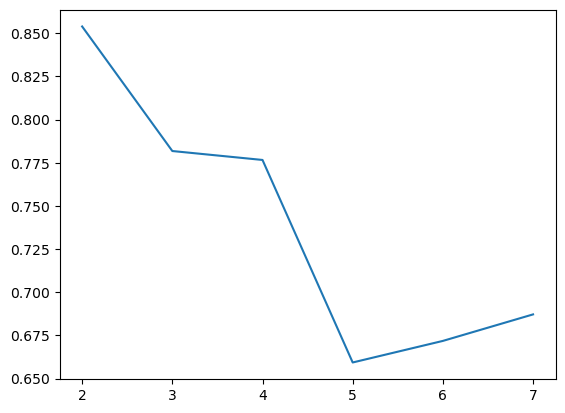

In [267]:
sns.lineplot(x = K, y = score)

<Axes: xlabel='artist_popularity', ylabel='artist_followers'>

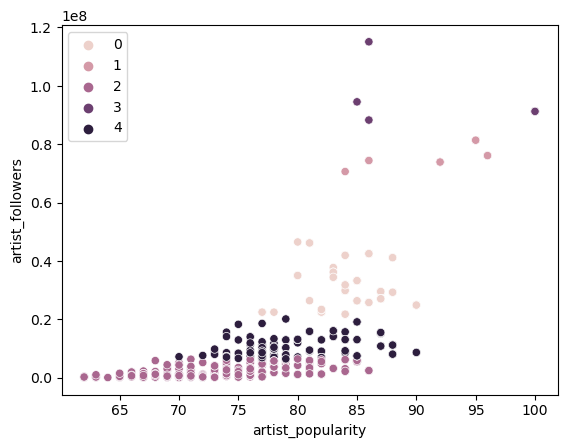

In [271]:
sns.scatterplot(data = X, x = 'artist_popularity', y = 'artist_followers', hue = fits[3].labels_)



/Users/priscilladanso/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/priscilladanso/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/priscilladanso/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/priscilladanso/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/priscilladanso/anaconda3/lib/pyth

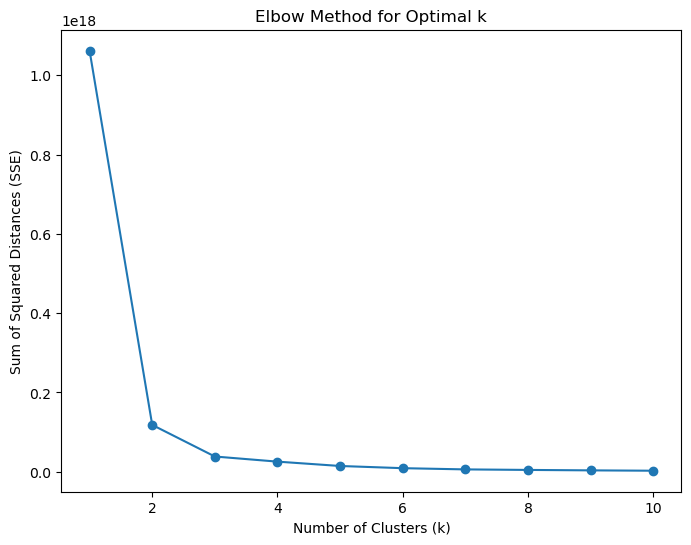

In [259]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Assuming your data is in X
# X = ...

# Calculate sum of squared distances for different values of k
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    sse.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), sse, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Distances (SSE)')
plt.show()


In [261]:
import plotly.express as px
from sklearn.cluster import KMeans
import pandas as pd

# Assuming your data is in df with features as columns
# df = ...

sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    sse.append(kmeans.inertia_)

# Create a DataFrame for plotting
elbow_data = pd.DataFrame({'k': range(1, 11), 'SSE': sse})

# Plot the elbow curve using Plotly Express
fig = px.line(elbow_data, x='k', y='SSE', title='Elbow Method for Optimal k')
fig.update_layout(xaxis_title='Number of Clusters (k)', yaxis_title='Sum of Squared Distances (SSE)')
fig.show()


/Users/priscilladanso/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/priscilladanso/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/priscilladanso/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/priscilladanso/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/priscilladanso/anaconda3/lib/pyth

In [262]:
fig = px.line(x = K, y = score)
fig.show()


,artist_id,artist_name,artist_popularity,artist_followers,artist_genres,song_id,song_name,album_id,album_name,track_popularity,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,cluster
0,40ZNYROS4zLfyyBSs2PGe2,Zach Bryan,86.0,2484367.0,"[classic oklahoma country, modern country pop]",4KULAymBBJcPRpk1yO4dOG,I Remember Everything (feat. Kacey Musgraves),6PbnGueEO6LGodPfvNldYf,Zach Bryan,93,...,-7.746,1,0.0459,0.5540,0.000002,0.102,0.1550,77.639,4,0
1,70kkdajctXSbqSMJbQO424,Kacey Musgraves,74.0,1252361.0,"[classic texas country, contemporary country, country dawn]",4KULAymBBJcPRpk1yO4dOG,I Remember Everything (feat. Kacey Musgraves),6PbnGueEO6LGodPfvNldYf,Zach Bryan,93,...,-7.746,1,0.0459,0.5540,0.000002,0.102,0.1550,77.639,4,0
2,3TVXtAsR1Inumwj472S9r4,Drake,95.0,81392636.0,"[canadian hip hop, canadian pop, hip hop, pop rap, rap]",2YSzYUF3jWqb9YP9VXmpjE,IDGAF (feat. Yeat),4czdORdCWP9umpbhFXK2fW,For All The Dogs,94,...,-8.399,1,0.2710,0.0464,0.000089,0.205,0.1380,136.952,4,3
3,3qiHUAX7zY4Qnjx8TNUzVx,Yeat,81.0,3426657.0,"[pluggnb, rage rap]",2YSzYUF3jWqb9YP9VXmpjE,IDGAF (feat. Yeat),4czdORdCWP9umpbhFXK2fW,For All The Dogs,94,...,-8.399,1,0.2710,0.0464,0.000089,0.205,0.1380,136.952,4,0
4,2uYWxilOVlUdk4oV9DvwqK,Mitski,81.0,5568028.0,"[brooklyn indie, pov: indie]",3vkCueOmm7xQDoJ17W1Pm3,My Love Mine All Mine,2Cn1d2KgbkAqbZCJ1RzdkA,The Land Is Inhospitable and So Are We,97,...,-14.958,1,0.0321,0.8680,0.135000,0.158,0.1210,113.950,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1447,716NhGYqD1jl2wI1Qkgq36,Bizarrap,84.0,13086837.0,"[argentine hip hop, pop venezolano, trap argentino, trap latino, urbano latino]",4SW9gHnW8NfKOdqmh0ij45,Fruto,4NMv3cMkDwkkR6EdLloQDB,en dormir sin Madrid,91,...,-8.205,0,0.2690,0.4940,0.000001,0.355,0.9230,160.254,4,4
1448,19HM5j0ULGSmEoRcrSe5x3,Milo j,81.0,1373051.0,[trap argentino],4SW9gHnW8NfKOdqmh0ij45,Fruto,4NMv3cMkDwkkR6EdLloQDB,en dormir sin Madrid,91,...,-8.205,0,0.2690,0.4940,0.000001,0.355,0.9230,160.254,4,0
1449,3TVXtAsR1Inumwj472S9r4,Drake,95.0,81392636.0,"[canadian hip hop, canadian pop, hip hop, pop rap, rap]",6KMbZt7u6AlDia2NPO0Liv,Slime You Out (feat. SZA),35nmDyrcnDY4B1ISYpKEEs,For All The Dogs,73,...,-9.259,0,0.0451,0.5360,0.000000,0.146,0.0944,86.520,3,3
1450,7tYKF4w9nC0nq9CsPZTHyP,SZA,87.0,15522335.0,"[pop, r&b, rap]",6KMbZt7u6AlDia2NPO0Liv,Slime You Out (feat. SZA),35nmDyrcnDY4B1ISYpKEEs,For All The Dogs,73,...,-9.259,0,0.0451,0.5360,0.000000,0.146,0.0944,86.520,3,4


In [291]:
a = df_sampled[df_sampled['flattened_genres'] == 'pop']

a[['flattened_genres','energy', 'danceability','key','mode','speechiness','acousticness','instrumentalness','liveness','valence','tempo']]


,flattened_genres,energy,danceability,key,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
19,pop,0.674,0.750,8.0,0.0,0.0970,0.22800,0.000089,0.122,0.392,123.026
21,pop,0.736,0.646,5.0,0.0,0.0449,0.21600,0.000000,0.415,0.873,140.098
34,pop,0.778,0.911,5.0,1.0,0.2620,0.08870,0.000022,0.179,0.345,96.057
38,pop,0.264,0.678,10.0,1.0,0.0622,0.75300,0.000000,0.302,0.528,121.722
39,pop,0.656,0.595,0.0,1.0,0.0370,0.04100,0.000000,0.122,0.191,99.994
...,...,...,...,...,...,...,...,...,...,...,...
1090,pop,0.924,0.587,11.0,0.0,0.0457,0.03110,0.017100,0.230,0.509,140.009
1104,pop,0.969,0.445,10.0,0.0,0.3380,0.00981,0.000000,0.851,0.225,143.887
1127,pop,0.870,0.809,8.0,0.0,0.0601,0.37600,0.000005,0.106,0.903,127.926
1145,pop,0.708,0.803,6.0,1.0,0.0329,0.14600,0.000038,0.115,0.889,129.936


In [348]:
import pandas as pd
import plotly.express as px
from sklearn.metrics.pairwise import cosine_similarity

# Assuming your DataFrame is named 'df' and contains audio features
# For demonstration, let's assume the user likes songs with high danceability and energy
user_profile = pd.DataFrame({
    'danceability': [0.8],
    'energy': [0.8],
    'key': [5],  # Assuming a key value
    'loudness': [-5],  # Assuming a loudness value
    'mode': [1],  # Assuming a mode value
    'speechiness': [0.1],
    'acousticness': [0.2],
    'instrumentalness': [0.05],
    'liveness': [0.1],
    'valence': [0.7],
    'tempo': [120],
})

# Calculate cosine similarity between the user profile and songs
song_features = df_sampled[['danceability', 'energy', 'key', 'loudness', 'mode',
                    'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']]



similarity_scores = cosine_similarity(user_profile, song_features)

# Recommend the top 10 songs based on similarity scores
top_songs_indices = similarity_scores.argsort()[0][-18:][::-1]
recommended_songs = df_sampled.iloc[top_songs_indices]

# Plot the recommended songs using Plotly
fig = px.bar(recommended_songs, x='song_name', y='track_popularity',
             title='Recommended Songs',
             color='artist_name',
             labels={'track_popularity': 'Track Popularity'},
#              template='plotly_dark'
             hover_data=['artist_genres'],
            )
# fig.update_traces(marker_color='skyblue')
fig.show()


In [320]:
user_profile = pd.DataFrame({
     'danceability': [0.8],
    'energy': [0.7],
    'valence': [0.9],
})

# Calculate cosine similarity between the user profile and songs
song_features = df_sampled[['danceability', 'energy','valence']]

similarity_scores = cosine_similarity(user_profile, song_features)

# Recommend the top 10 songs based on similarity scores
top_songs_indices = similarity_scores.argsort()[0][-15:][::-1]
recommended_songs = df_sampled.iloc[top_songs_indices]

# Plot the recommended songs using Plotly
fig = px.bar(recommended_songs, x='song_name', y='track_popularity',
             title='Recommended Songs',
             color='artist_name',
             labels={'track_popularity': 'Track Popularity'},
#              template='plotly_dark'
             hover_data=['artist_genres'],
            )
# fig.update_traces(marker_color='skyblue')
fig.show()


In [298]:
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity

# Assuming 'df' is your DataFrame with song metadata and features

# Create a user profile (for example)
user_profile = pd.DataFrame({
    'danceability': [0.8],
    'energy': [0.7],
    'valence': [0.9],
    # Add more attributes based on user preferences
})

# Calculate cosine similarity between the user profile and songs
song_features = drop_df[['danceability', 'energy', 'valence']]
similarity_scores = cosine_similarity(user_profile, song_features)

# Recommend top-N songs based on similarity scores
top_songs_indices = similarity_scores.argsort()[0][-10:][::-1]
recommended_songs = drop_df.iloc[top_songs_indices]

# Display recommended songs
print(recommended_songs[['song_name', 'artist_name']])


                      song_name         artist_name
90                     Lollipop              Darell
1145                   La Fresa      Eslabon Armado
1146                   La Fresa  Gabito Ballesteros
579                    DOGTOOTH  Tyler, The Creator
448                    ROCKSTAR            Junior H
191                        LUNA          Peso Pluma
192                        LUNA            Junior H
320              Mi Bello Angel       Natanael Cano
366                     Feather   Sabrina Carpenter
637   MIENTRAS ME CURO DEL CORA             KAROL G


In [299]:
similarity_scores

array([[0.8932252 , 0.8932252 , 0.846807  , ..., 0.92340424, 0.93147936,
        0.93471284]])

In [300]:
fig = px.bar(recommended_songs, x='song_name', y='artist_name',
             title='Recommended Songs',
#              labels={'track_popularity': 'Popularity'},
#              template='plotly_dark'
            )
fig.update_traces(marker_color='skyblue')
fig.show()